In [1]:
import pandas as pd
from pandas import ExcelWriter
from pandas import ExcelFile
#import geopandas as gpd
from shapely.geometry import Point
import shapely
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import statsmodels.tsa.stattools as sm
from sklearn.metrics import accuracy_score, mean_squared_error,r2_score
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.api import VAR, DynamicVAR
from statsmodels.tsa.base.datetools import dates_from_str
import seaborn as sns
from pandas import Series
from sklearn.model_selection import TimeSeriesSplit
from matplotlib import pyplot

/Users/VarshiniSelvadurai/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/VarshiniSelvadurai/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/VarshiniSelvadurai/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/VarshiniSelvadurai/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/VarshiniSelvadurai/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  retu

In [2]:
#Getting 2017 data
data = pd.read_excel('/Users/VarshiniSelvadurai/Documents/Internship/Crime_Edited.xlsx', sheet_name = '2017')
#data = pd.read_excel('C:\\Users\\vns8\\Documents\\Crime_Edited.xlsx', sheet_name = '2017')
data = data.loc[data["Crime Name1"] != "Not a Crime"]
data = data.drop(columns = ["Police District Number","Address Number","Victims","CR Number","NIBRS Code","Beat","PRA","State","Incident ID","Offence Code","Sector","Police District Name","Crime Name2","Crime Name3","Agency","Place","End Date/Time","Dispatch Date/Time","Block_Address"])
ugh = list(map(str, data["Start Time"]))
for i in range (0, len(ugh)):
    ugh[i] = ugh[i][:2]
data["Start Time"] = ugh
ugh = (list(map(str,data['Start Date'])))
ughh = []
for i in range(0,len(ugh)):
    ugh[i] = ugh[i][5:]
    ugh[i] = ugh[i][:5]
data['Start Date'] = ugh

In [3]:
#Getting 2018 data
data_2018 = pd.read_excel('/Users/VarshiniSelvadurai/Documents/Internship/Crime_Edited.xlsx', sheet_name = '2018')
#data = pd.read_excel('C:\\Users\\vns8\\Documents\\Crime_Edited.xlsx', sheet_name = '2017')
data_2018 = data_2018.loc[data_2018["Crime Name1"] != "Not a Crime"]
data_2018 = data_2018.drop(columns = ["Police District Number","Address Number","Victims","CR Number","NIBRS Code","Beat","PRA","State","Incident ID","Offence Code","Sector","Police District Name","Crime Name2","Crime Name3","Agency","Place","End Date/Time","Dispatch Date/Time","Block_Address"])
ugh = list(map(str, data_2018["Start Time"]))
for i in range (0, len(ugh)):
    ugh[i] = ugh[i][:2]
data_2018["Start Time"] = ugh
ugh = (list(map(str,data_2018['Start Date'])))
ughh = []
for i in range(0,len(ugh)):
    ugh[i] = ugh[i][5:]
    ugh[i] = ugh[i][:5]
data_2018['Start Date'] = ugh

In [4]:
whatev = list(map(str, data_2018['Start Date'].value_counts().keys().tolist()))
zipcodes = list(map(str, data['Zip Code'].value_counts().keys().tolist()))[:33]
ughhh = []
ughhh_2018 = []
for z in zipcodes:
    x = data.loc[data["Zip Code"] == int(z)]
    start_date = ['01-01', '01-02', '01-03', '01-04', '01-05', '01-06', '01-07', '01-08', '01-09', '01-10', '01-11', '01-12', '01-13', '01-14', '01-15', '01-16', '01-17', '01-18', '01-19', '01-20', '01-21', '01-22', '01-23', '01-24', '01-25', '01-26', '01-27', '01-28', '01-29', '01-30', '01-31', '02-01', '02-02', '02-03', '02-04', '02-05', '02-06', '02-07', '02-08', '02-09', '02-10', '02-11', '02-12', '02-13', '02-14', '02-15', '02-16', '02-17', '02-18', '02-19', '02-20', '02-21', '02-22', '02-23', '02-24', '02-25', '02-26', '02-27', '02-28', '03-01', '03-02', '03-03', '03-04', '03-05', '03-06', '03-07', '03-08', '03-09', '03-10', '03-11', '03-12', '03-13', '03-14', '03-15', '03-16', '03-17', '03-18', '03-19', '03-20', '03-21', '03-22', '03-23', '03-24', '03-25', '03-26', '03-27', '03-28', '03-29', '03-30', '03-31', '04-01', '04-02', '04-03', '04-04', '04-05', '04-06', '04-07', '04-08', '04-09', '04-10', '04-11', '04-12', '04-13', '04-14', '04-15', '04-16', '04-17', '04-18', '04-19', '04-20', '04-21', '04-22', '04-23', '04-24', '04-25', '04-26', '04-27', '04-28', '04-29', '04-30', '05-01', '05-02', '05-03', '05-04', '05-05', '05-06', '05-07', '05-08', '05-09', '05-10', '05-11', '05-12', '05-13', '05-14', '05-15', '05-16', '05-17', '05-18', '05-19', '05-20', '05-21', '05-22', '05-23', '05-24', '05-25', '05-26', '05-27', '05-28', '05-29', '05-30', '05-31', '06-01', '06-02', '06-03', '06-04', '06-05', '06-06', '06-07', '06-08', '06-09', '06-10', '06-11', '06-12', '06-13', '06-14', '06-15', '06-16', '06-17', '06-18', '06-19', '06-20', '06-21', '06-22', '06-23', '06-24', '06-25', '06-26', '06-27', '06-28', '06-29', '06-30', '07-01', '07-02', '07-03', '07-04', '07-05', '07-06', '07-07', '07-08', '07-09', '07-10', '07-11', '07-12', '07-13', '07-14', '07-15', '07-16', '07-17', '07-18', '07-19', '07-20', '07-21', '07-22', '07-23', '07-24', '07-25', '07-26', '07-27', '07-28', '07-29', '07-30', '07-31', '08-01', '08-02', '08-03', '08-04', '08-05', '08-06', '08-07', '08-08', '08-09', '08-10', '08-11', '08-12', '08-13', '08-14', '08-15', '08-16', '08-17', '08-18', '08-19', '08-20', '08-21', '08-22', '08-23', '08-24', '08-25', '08-26', '08-27', '08-28', '08-29', '08-30', '08-31', '09-01', '09-02', '09-03', '09-04', '09-05', '09-06', '09-07', '09-08', '09-09', '09-10', '09-11', '09-12', '09-13', '09-14', '09-15', '09-16', '09-17', '09-18', '09-19', '09-20', '09-21', '09-22', '09-23', '09-24', '09-25', '09-26', '09-27', '09-28', '09-29', '09-30', '10-01', '10-02', '10-03', '10-04', '10-05', '10-06', '10-07', '10-08', '10-09', '10-10', '10-11', '10-12', '10-13', '10-14', '10-15', '10-16', '10-17', '10-18', '10-19', '10-20', '10-21', '10-22', '10-23', '10-24', '10-25', '10-26', '10-27', '10-28', '10-29', '10-30', '10-31', '11-01', '11-02', '11-03', '11-04', '11-05', '11-06', '11-07', '11-08', '11-09', '11-10', '11-11', '11-12', '11-13', '11-14', '11-15', '11-16', '11-17', '11-18', '11-19', '11-20', '11-21', '11-22', '11-23', '11-24', '11-25', '11-26', '11-27', '11-28', '11-29', '11-30', '12-01', '12-02', '12-03', '12-04', '12-05', '12-06', '12-07', '12-08', '12-09', '12-10', '12-11', '12-12', '12-13', '12-14', '12-15', '12-16', '12-17', '12-18', '12-19', '12-20', '12-21', '12-22', '12-23', '12-24', '12-25', '12-26', '12-27', '12-28', '12-29', '12-30', '12-31']
    ugh = [0 for i in range(0,len(start_date))]
    ughh = [0 for i in range(0,len(start_date))]
    for index,row in x.iterrows():
        a = start_date.index(row["Start Date"])
        ugh[a] += 1
    march = pd.DataFrame({"Crime Count": ugh, "Date":start_date} )
    ughhh.append(march)
    
    y = data_2018.loc[data_2018["Zip Code"] == int(z)]
    start_date = whatev
    ugh = [0 for i in range(0,len(start_date))]
    ughh = [0 for i in range(0,len(start_date))]
    for index,row in y.iterrows():
        a = start_date.index(row["Start Date"])
        ugh[a] += 1
    march = pd.DataFrame({"Crime Count": ugh, "Date":start_date} )
    ughhh_2018.append(march)

In [5]:
lag = [[i for i in range (0,len(zipcodes))] for j in range (0,len(zipcodes))]
pvalue = [[i for i in range (0,len(zipcodes))] for j in range (0,len(zipcodes))]
reject = [[i for i in range (0,len(zipcodes))] for j in range (0,len(zipcodes))]
i = 0
j = 0
for z in ughhh:
    for z2 in ughhh:
        if i!=j:
            a = 0
            date = pd.DataFrame({zipcodes[i]: list(z["Crime Count"]),zipcodes[j]: list(z2["Crime Count"])})
            try:
                model = VAR(date)
                results = model.fit(ic='aic')
                try:
                    y = results.test_causality(zipcodes[i],zipcodes[j], kind='f')
                    #print (y.summary())
                    #print("LAG: ", results.k_ar)
                    lag[i][j] = (results.k_ar)
                    pvalue[i][j] = y.pvalue
                except:
                    lag[i][j] = -50
                    pvalue[i][j] = 1
            except:
                lag[i][j] = -50
                pvalue[i][j] = 1
                
            if pvalue[i][j]<.05:
                reject[i][j] = 1
            else:
                reject[i][j] = 0
        else:
            lag[i][j] = 0
            pvalue[i][j] = 0
            reject[i][j] = 1
        j += 1
    j = 0
    i += 1

In [6]:
laag = pd.DataFrame({"Zip Codes":zipcodes, '20910':lag[0], '20902':lag[1], '20906':lag[2], 
                    '20874':lag[3], '20904':lag[4], '20850':lag[5], '20877':lag[6], 
                    '20878':lag[7], '20852':lag[8], '20901':lag[9], '20814':lag[10], 
                    '20886':lag[11], '20876':lag[12], '20912':lag[13], '20817':lag[14], 
                    '20879':lag[15], '20903':lag[16], '20853':lag[17], '20854':lag[18], 
                    '20815':lag[19], '20832':lag[20], '20895':lag[21], '20851':lag[22], 
                    '20866':lag[23], '20855':lag[24], '20905':lag[25], '20871':lag[26], 
                    '20872':lag[27], '20816':lag[28], '20841':lag[29], '20882':lag[30], 
                    '20833':lag[31], '20837':lag[32]})
pvaalue = pd.DataFrame({"Zip Codes":zipcodes, '20910':pvalue[0], '20902':pvalue[1], '20906':pvalue[2], 
                    '20874':pvalue[3], '20904':pvalue[4], '20850':pvalue[5], '20877':pvalue[6], 
                    '20878':pvalue[7], '20852':pvalue[8], '20901':pvalue[9], '20814':pvalue[10], 
                    '20886':pvalue[11], '20876':pvalue[12], '20912':pvalue[13], '20817':pvalue[14], 
                    '20879':pvalue[15], '20903':pvalue[16], '20853':pvalue[17], '20854':pvalue[18], 
                    '20815':pvalue[19], '20832':pvalue[20], '20895':pvalue[21], '20851':pvalue[22], 
                    '20866':pvalue[23], '20855':pvalue[24], '20905':pvalue[25], '20871':pvalue[26], 
                    '20872':pvalue[27], '20816':pvalue[28], '20841':pvalue[29], '20882':pvalue[30], 
                    '20833':pvalue[31], '20837':pvalue[32]})
reeject = pd.DataFrame({"Zip Codes":zipcodes, '20910':reject[0], '20902':reject[1], '20906':reject[2], 
                    '20874':reject[3], '20904':reject[4], '20850':reject[5], '20877':reject[6], 
                    '20878':reject[7], '20852':reject[8], '20901':reject[9], '20814':reject[10], 
                    '20886':reject[11], '20876':reject[12], '20912':reject[13], '20817':reject[14], 
                    '20879':reject[15], '20903':reject[16], '20853':reject[17], '20854':reject[18], 
                    '20815':reject[19], '20832':reject[20], '20895':reject[21], '20851':reject[22], 
                    '20866':reject[23], '20855':reject[24], '20905':reject[25], '20871':reject[26], 
                    '20872':reject[27], '20816':reject[28], '20841':reject[29], '20882':reject[30], 
                    '20833':reject[31], '20837':reject[32]})

In [11]:
laag = laag.set_index('Zip Codes')
reeject = reeject.set_index("Zip Codes")
pvaalue = pvaalue.set_index("Zip Codes")

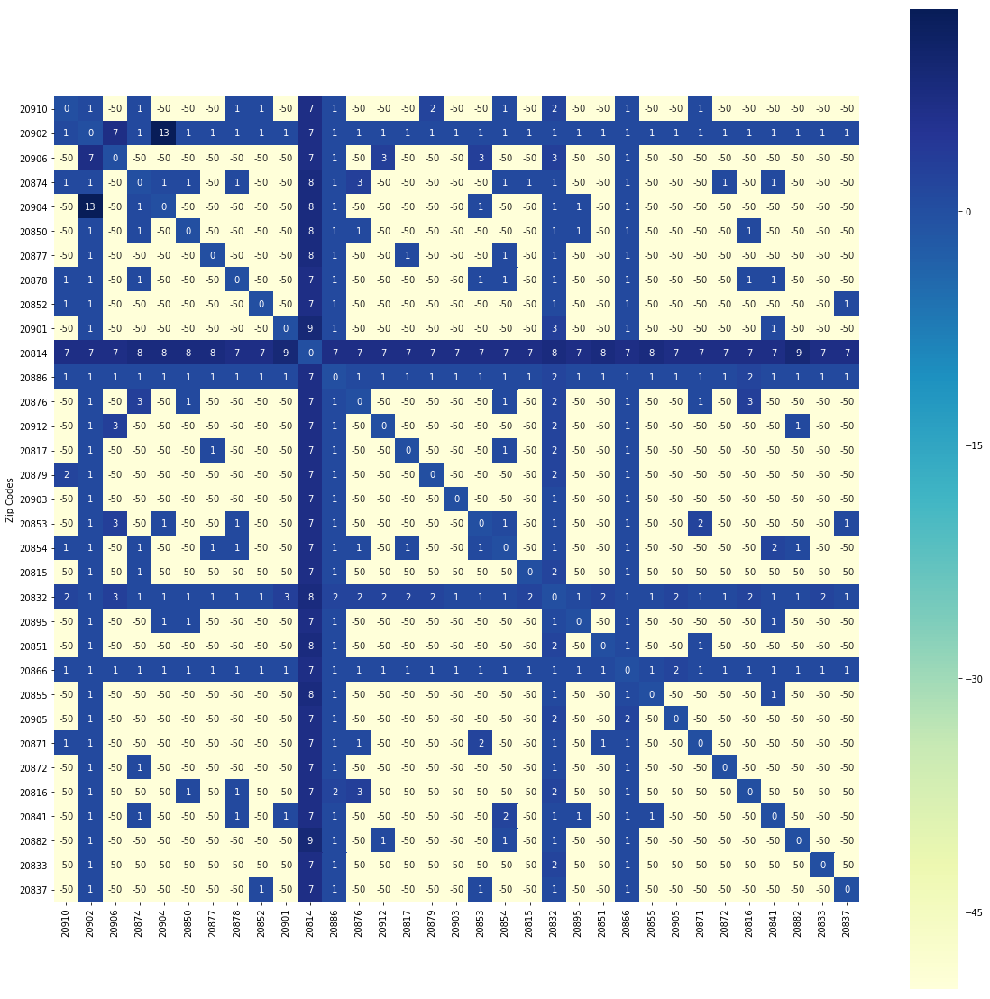

In [12]:
f, ax, = plt.subplots(figsize=(20,20))
ax = sns.heatmap(laag, square = True, cmap="YlGnBu",ax=ax,annot = True)

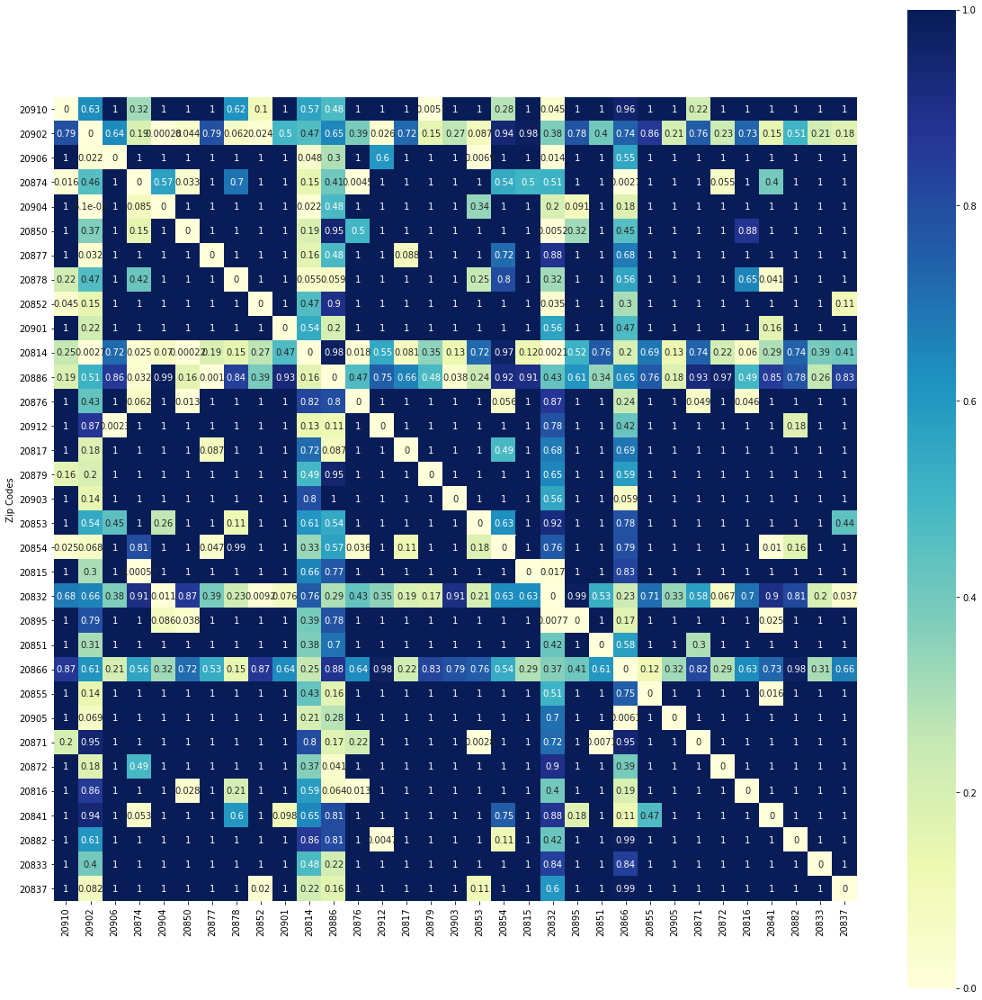

In [13]:
f, ax, = plt.subplots(figsize=(20,20))
ax = sns.heatmap(pvaalue, square = True, cmap="YlGnBu",ax=ax,annot = True)

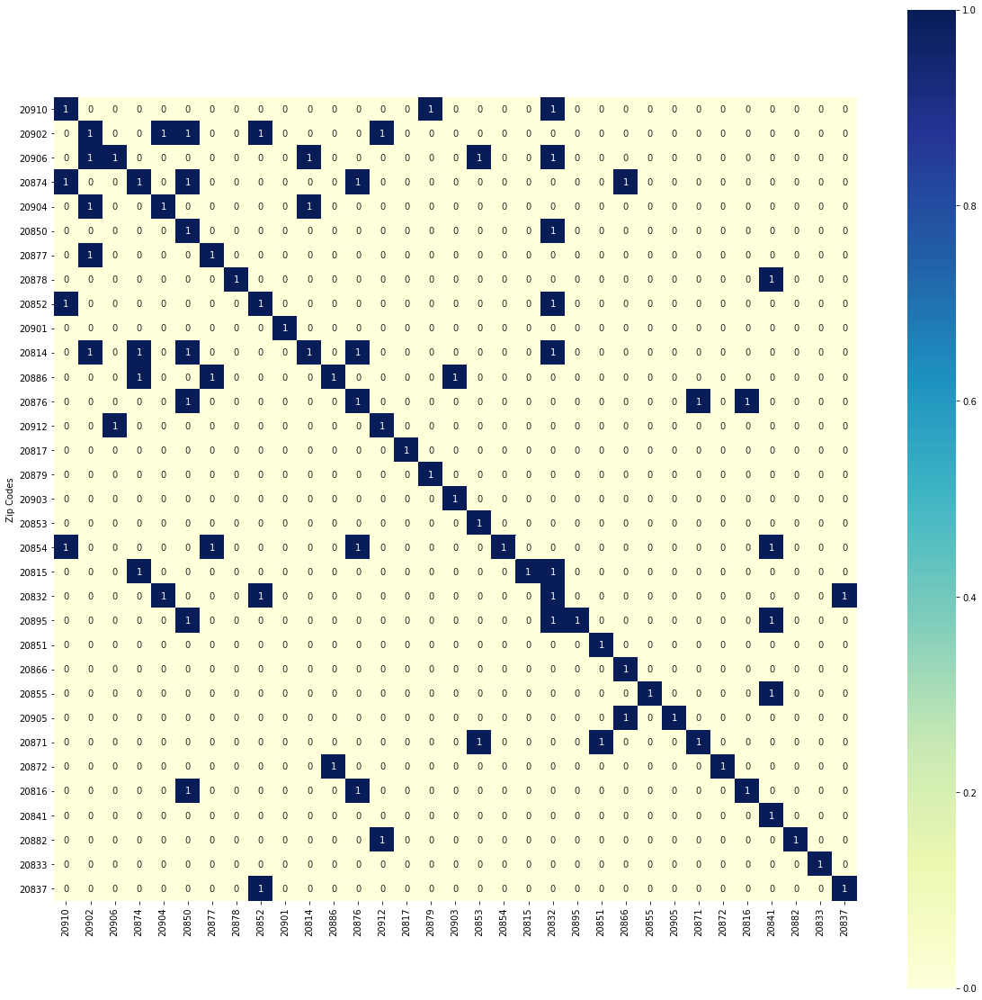

In [14]:
f, ax, = plt.subplots(figsize=(20,20))
ax = sns.heatmap(reeject, square = True, cmap="YlGnBu",ax=ax,annot = True)

In [6]:
import itertools
yes = []
gr = []
gr_ = []
for i in range(0,len(reject)):
    mse = []
    col = []
    mod = []
    for j in range (0,len(reject[0])):
        if ((i!=j) and (reject[i][j] == 1)):
            col.append(j)  
    print("Predict",zipcodes[i])
#AR        
    print("\tUsing",zipcodes[i])
    model = AR(list(ughhh[i]["Crime Count"]))
    res = model.fit(ic = 'aic')
    #res.plot_predict(start=365, end=535)
    #plt.show()
    #print(res.summary())
    y = res.predict(start=365, end=365).tolist()
    y_hat = list(ughhh_2018[i]["Crime Count"])[:1]
    print("\t\tMSE:",mean_squared_error(y_hat,y))
    mse.append(mean_squared_error(y_hat,y))
    mod.append("AR")
    gr_.append([])
    #plt.figure(figsize=(10,5))
    #plt.plot(y_hat)
    #plt.plot(y)
    #plt.show()
    if len(col)>0:
#VAR
        for L in range(1, len(col)+1):
            for subset in itertools.combinations(col, L):
                zips = []
                print()
                date = pd.DataFrame({zipcodes[i]: list(ughhh[i]["Crime Count"])})
                for z in subset:
                    print("\tUsing",zipcodes[z])
                    date[zipcodes[z]] = ughhh[z]["Crime Count"]
                    zips.append(zipcodes[z])
                try:
                    model = VAR(date)
                    #print(model)
                    results = model.fit(ic='aic')
                    #print (y.summary())
                    #print("LAG: ", results.k_ar)
                    #print(results.summary())
                    #ax = results.plot_forecast(7)
                    #plt.show()
                    prediction = []
                    #print(np.array(date).shape)
                    pred = results.forecast(y = np.array(date),steps = 1)
                    for coor in pred:
                        prediction.append(coor[0])
                    actual = list(ughhh_2018[i]["Crime Count"])[:1]
                    print("\t\tMSE:", mean_squared_error(actual,prediction))
                    mse.append(mean_squared_error(actual,prediction))
                    s = ''
                    for q in zips:
                        s += str(q)
                        s += " "
                    mod.append("VAR - " + s.strip())
                    #plt.figure(figsize=(10,5))
                    #plt.plot(actual)
                    #plt.plot(prediction)
                    #plt.show()
                except:
                    #print(results.summary())
                    mse.append(1000000000000000000000000000000000000)
                    mod.append("VAR didn't work")
    gr.append(col)
    try:
        smol = min(mse)
        #print(mse)
        #print(mod)
        #print(smol)
        index = mse.index(smol)
        yes.append([zipcodes[i],mod[index],round(smol,4)])
        #print(mod[index])
    except:
        yes.append([zipcodes[i],"AR - No Granger Causality"])
#c1,c2,c3,c4,c5 t
#AR(t)
#VAR(c1,c2,c3,c4,c5,t1)
#see which MSE is better
#remove sipcodes w/o seasonality
#spatial temporal can be exploited

Predict 20910
	Using 20910
		MSE: 6.9372501350504425

	Using 20874
		MSE: 14.9796688565532

	Using 20852
		MSE: 9.592255429520021

	Using 20854
		MSE: 5.123363927616777

	Using 20874
	Using 20852

	Using 20874
	Using 20854
		MSE: 12.533222972918098

	Using 20852
	Using 20854
		MSE: 7.398181022305014

	Using 20874
	Using 20852
	Using 20854
Predict 20902
	Using 20902
		MSE: 12.971712406232172

	Using 20906
		MSE: 34.77278659251549

	Using 20904
		MSE: 28.62556336045418

	Using 20877
		MSE: 11.97935017992468

	Using 20814
		MSE: 19.972281923178915

	Using 20906
	Using 20904
		MSE: 17.325728903217342

	Using 20906
	Using 20877

	Using 20906
	Using 20814
		MSE: 38.623401075688406

	Using 20904
	Using 20877
		MSE: 25.27386858512889

	Using 20904
	Using 20814
		MSE: 33.128678359488845

	Using 20877
	Using 20814
		MSE: 18.741299921090548

	Using 20906
	Using 20904
	Using 20877
		MSE: 15.70033220787346

	Using 20906
	Using 20904
	Using 20814
		MSE: 16.82872253259237

	Using 20906
	Using 20877
	

		MSE: 8.870559257550015

	Using 20906
		MSE: 9.351802067778179

	Using 20850
		MSE: 9.873952761014555

	Using 20852
		MSE: 9.13526489568401

	Using 20814
		MSE: 8.164803304818404

	Using 20815
		MSE: 10.534967835202988

	Using 20895
		MSE: 9.337091992124442

	Using 20910
	Using 20906
		MSE: 7.230582454450084

	Using 20910
	Using 20850
		MSE: 10.837920217649387

	Using 20910
	Using 20852
		MSE: 9.104655294384317

	Using 20910
	Using 20814
		MSE: 11.737668037135425

	Using 20910
	Using 20815
		MSE: 9.329251222001545

	Using 20910
	Using 20895
		MSE: 9.30149590367531

	Using 20906
	Using 20850
		MSE: 10.005345951574375

	Using 20906
	Using 20852
		MSE: 9.3121102554291

	Using 20906
	Using 20814
		MSE: 9.695034841963059

	Using 20906
	Using 20815
		MSE: 9.507007439837363

	Using 20906
	Using 20895
		MSE: 9.578934349345491

	Using 20850
	Using 20852
		MSE: 10.830866238234766

	Using 20850
	Using 20814
		MSE: 9.836684839282723

	Using 20850
	Using 20815
		MSE: 11.20038540741342

	Using 2085

	Using 20906
	Using 20852
	Using 20814
	Using 20815
	Using 20895

	Using 20910
	Using 20850
	Using 20852
	Using 20814
	Using 20815
	Using 20895
		MSE: 13.12669685376709

	Using 20906
	Using 20850
	Using 20852
	Using 20814
	Using 20815
	Using 20895
		MSE: 13.102864491763349

	Using 20910
	Using 20906
	Using 20850
	Using 20852
	Using 20814
	Using 20815
	Using 20895
Predict 20895
	Using 20895
		MSE: 5.695904319402352
Predict 20851
	Using 20851
		MSE: 41.10229434191705

	Using 20871
		MSE: 34.91256819668082
Predict 20866
	Using 20866
		MSE: 9.059347917979734

	Using 20874
		MSE: 6.191887559930176

	Using 20905
		MSE: 11.223114994153248

	Using 20874
	Using 20905
		MSE: 7.7669301772969455
Predict 20855
	Using 20855
		MSE: 0.025821732864888255
Predict 20905
	Using 20905
		MSE: 0.3824585585432154
Predict 20871
	Using 20871
		MSE: 0.2581897503750558

	Using 20876
		MSE: 0.16031928482485133
Predict 20872
	Using 20872
		MSE: 3.75527659657556
Predict 20816
	Using 20816
		MSE: 0.5961289267925775



In [7]:
def autoregression(i,train, test):
    try:
        model = AR(train)
        res = model.fit(ic = 'aic')
        #res.plot_predict(start=365, end=535)
        #plt.show()
        #print(res.summary())
        y = res.predict(start=len(train), end=len(train)).tolist()
        y_hat = list(test)
        #print("\t\tMSE:",mean_squared_error(y_hat,y[:1]))
        #plt.figure(figsize=(10,5))
        #plt.plot(y_hat)
        #plt.plot(y)
        #plt.show()
        return mean_squared_error(y_hat,y)
    except:
        ads = None
        #print("NO")

In [8]:
def vector_autoregression(col,i,test,train):
    for L in range(1, len(col)+1):
            for subset in itertools.combinations(col, L):
                zips = []
                #print()
                date = pd.DataFrame({zipcodes[i]: test})
                for z in subset:
                    #print("\tUsing",zipcodes[z])
                    date[zipcodes[z]] = ughhh[z]["Crime Count"]
                    zips.append(zipcodes[z])
                try:
                    model = VAR(date)
                    #print(model)
                    results = model.fit(ic='aic')
                    #print (y.summary())
                    #print("LAG: ", results.k_ar)
                    #print(results.summary())
                    #ax = results.plot_forecast(7)
                    #plt.show()
                    prediction = []
                    #print(np.array(date).shape)
                    pred = results.forecast(y = np.array(date),steps = 1)
                    for coor in pred:
                        prediction.append(coor[0])
                    actual = train[:1]
                    #print("\t\tMSE:", mean_squared_error(actual,prediction))
                    s = ''
                    for q in zips:
                        s += str(q)
                        s += " "
                    return (mean_squared_error(actual,prediction)), ("VAR - " + s.strip())
                    #plt.figure(figsize=(10,5))
                    #plt.plot(actual)
                    #plt.plot(prediction)
                    #plt.show()
                except:
                    #print(results.summary())
                    return (None, "VAR didn't work")

In [9]:
def cross_validation(col,i,dataframe,dataframe_2018,s):
    X = dataframe["Crime Count"]
    splits = TimeSeriesSplit(n_splits=364)
    pyplot.figure(1)
    index = 1
    cv_mse = []
    if s == "AR":
        #print("\tUsing",zipcodes[i])
        for train_index, test_index in splits.split(X):
            train = X[train_index]
            test = X[test_index]
            #print('Observations: %d' % (len(train) + len(test)))
            #print('Training Observations: %d' % (len(train)))
            #print('Testing Observations: %d' % (len(test)))
            cv_mse.append(autoregression(i,train,test))
        cv_mse.append(autoregression(i,list(dataframe["Crime Count"]),list(dataframe_2018["Crime Count"])[:1]))
        mod_result = "AR"
    elif s == "VAR":
        for train_index, test_index in splits.split(X):
            train = X[train_index]
            test = X[test_index]
            #print('Observations: %d' % (len(train) + len(test)))
            #print('Training Observations: %d' % (len(train)))
            #print('Testing Observations: %d' % (len(test)))
            mse_result,mod_result = vector_autoregression(col,i,train,test)
            cv_mse.append(mse_result)
        mse_result,mod_result = vector_autoregression(col,i,list(dataframe["Crime Count"]),list(dataframe_2018["Crime Count"])[:1])
        cv_mse.append(mse_result)
        #pyplot.plot(train)
        #pyplot.plot([None for i in train] + [x for x in test])
        #pyplot.show()
    for r in range (0,cv_mse.count(None)):
        cv_mse.remove(None)
    #print("\t\tMSE:", np.mean(cv_mse))
    return (np.mean(cv_mse), mod_result)

In [10]:
import itertools
yes = []
gr = []
gr_ = []
for i in range(0,len(reject)):
    mse = []
    col = []
    mod = []
    for j in range (0,len(reject[0])):
        if ((i!=j) and (reject[i][j] == 1)):
            col.append(j)  
    print("Predict",zipcodes[i])
    
    (mse_result, mod_result) = (cross_validation(col,i,ughhh[i],ughhh_2018[i],"AR"))
    mse.append(mse_result)
    mod.append(mod_result)
    
    if len(col)>0:
        mse_result, mod_result = cross_validation(col,i,ughhh[i],ughhh_2018[i],"VAR")    
        mse.append(mse_result)
        mod.append(mod_result)
    gr.append(col)
    smol = min(mse)
    #print(mse)
    #print(mod)
    #print(smol)
    index = mse.index(smol)
    print([zipcodes[i],mod[index],round(smol,4)])
    for ind in range (0,len(mod)):
        print("\t\t"[zipcodes[i],mod[ind],round(mse[ind],4)])
    yes.append([zipcodes[i],mod[index],round(smol,4)])
    if (len(mse)!=len(mod)):
        print("error")
    #print(mod[index])
#c1,c2,c3,c4,c5 t
#AR(t)
#VAR(c1,c2,c3,c4,c5,t1)
#see which MSE is better
#remove sipcodes w/o seasonality
#spatial temporal can be exploited

Predict 20910


/Users/VarshiniSelvadurai/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/ar_model.py:734: RuntimeWarning: divide by zero encountered in log
  return np.log(self.sigma2) + 2 * (1 + self.df_model)/self.nobs
/Users/VarshiniSelvadurai/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/vector_ar/var_model.py:707: RuntimeWarning: invalid value encountered in true_divide
  omega = sse / df_resid
/Users/VarshiniSelvadurai/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/vector_ar/var_model.py:707: RuntimeWarning: divide by zero encountered in true_divide
  omega = sse / df_resid
/Users/VarshiniSelvadurai/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/vector_ar/var_model.py:1316: RuntimeWarning: invalid value encountered in multiply
  return self.sigma_u * self.df_resid / self.nobs


['20910', 'VAR - 20874', 36.2207]


TypeError: string indices must be integers

<Figure size 432x288 with 0 Axes>

In [ ]:
for s in yes:
    print(s)

Observations: 2
Training Observations: 1
Testing Observations: 1


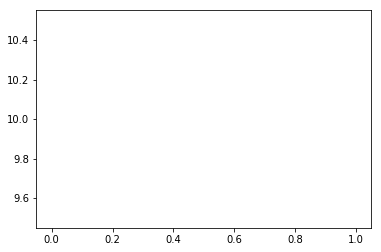

Observations: 3
Training Observations: 2
Testing Observations: 1


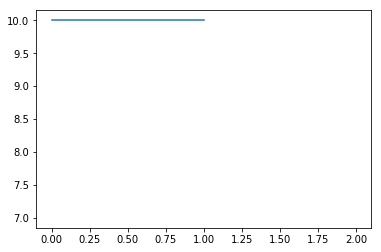

Observations: 4
Training Observations: 3
Testing Observations: 1


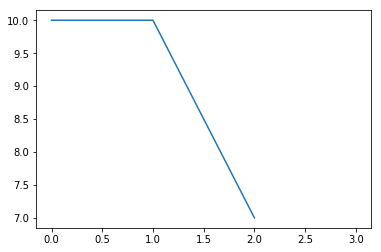

Observations: 5
Training Observations: 4
Testing Observations: 1


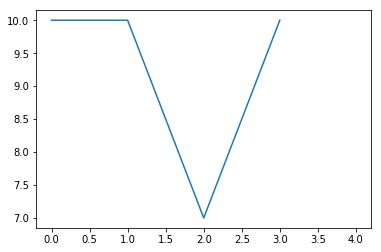

Observations: 6
Training Observations: 5
Testing Observations: 1


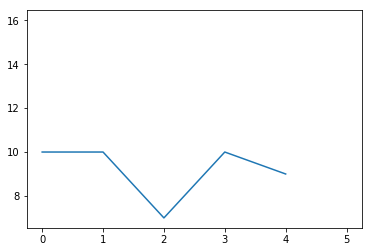

Observations: 7
Training Observations: 6
Testing Observations: 1


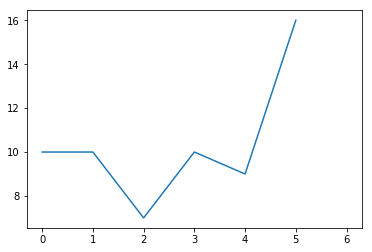

Observations: 8
Training Observations: 7
Testing Observations: 1


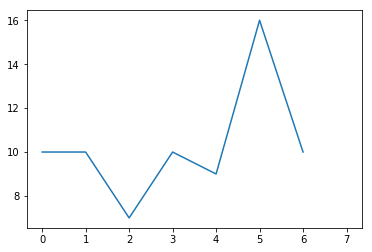

Observations: 9
Training Observations: 8
Testing Observations: 1


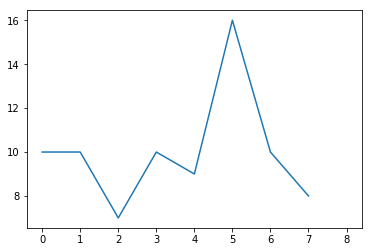

Observations: 10
Training Observations: 9
Testing Observations: 1


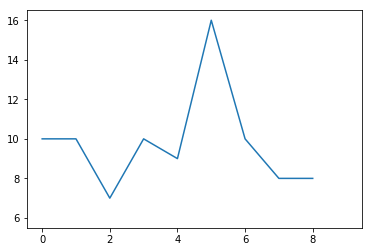

Observations: 11
Training Observations: 10
Testing Observations: 1


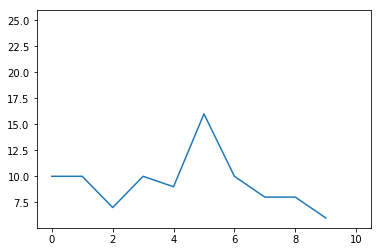

Observations: 12
Training Observations: 11
Testing Observations: 1


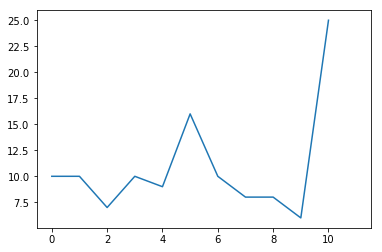

Observations: 13
Training Observations: 12
Testing Observations: 1


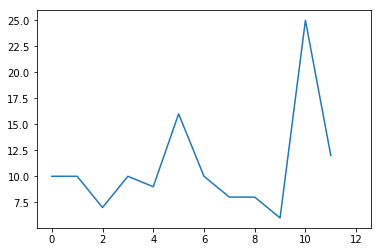

Observations: 14
Training Observations: 13
Testing Observations: 1


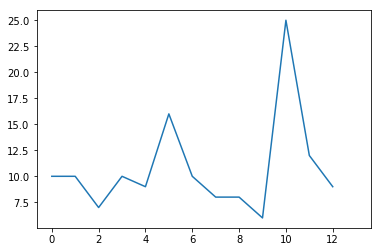

Observations: 15
Training Observations: 14
Testing Observations: 1


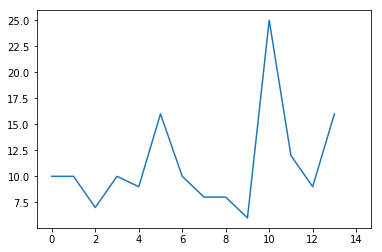

Observations: 16
Training Observations: 15
Testing Observations: 1


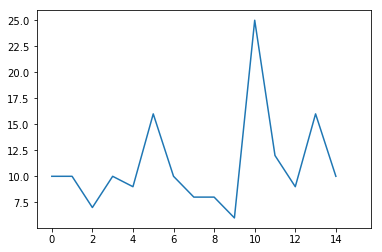

Observations: 17
Training Observations: 16
Testing Observations: 1


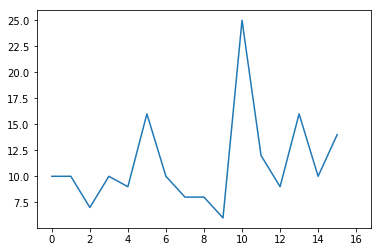

Observations: 18
Training Observations: 17
Testing Observations: 1


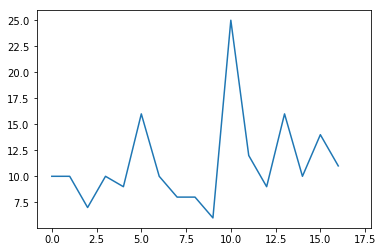

Observations: 19
Training Observations: 18
Testing Observations: 1


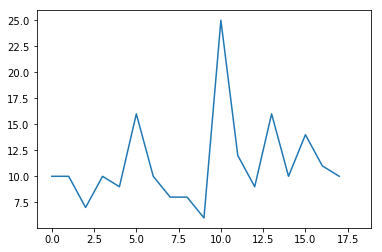

Observations: 20
Training Observations: 19
Testing Observations: 1


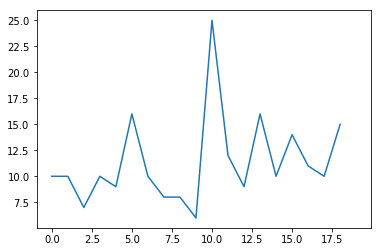

Observations: 21
Training Observations: 20
Testing Observations: 1


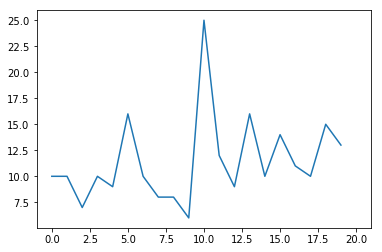

Observations: 22
Training Observations: 21
Testing Observations: 1


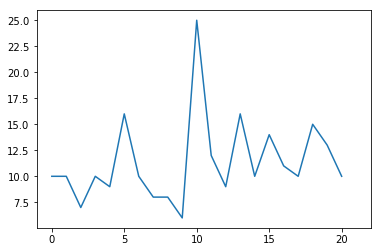

Observations: 23
Training Observations: 22
Testing Observations: 1


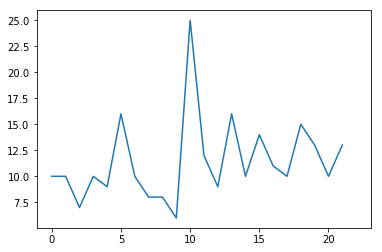

Observations: 24
Training Observations: 23
Testing Observations: 1


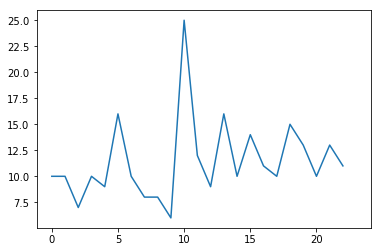

Observations: 25
Training Observations: 24
Testing Observations: 1


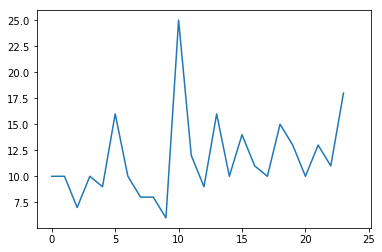

Observations: 26
Training Observations: 25
Testing Observations: 1


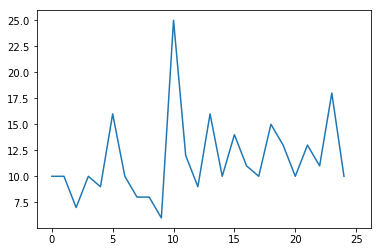

Observations: 27
Training Observations: 26
Testing Observations: 1


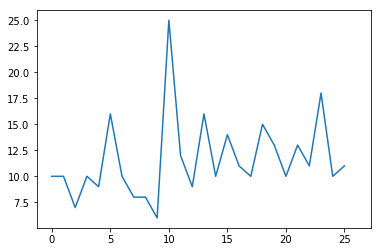

Observations: 28
Training Observations: 27
Testing Observations: 1


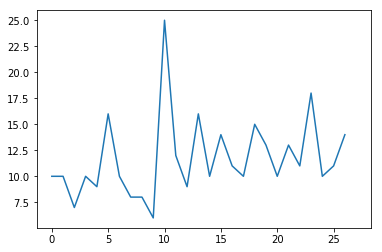

Observations: 29
Training Observations: 28
Testing Observations: 1


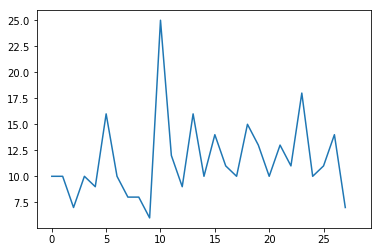

Observations: 30
Training Observations: 29
Testing Observations: 1


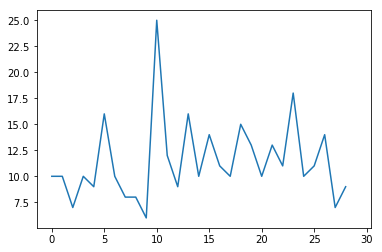

Observations: 31
Training Observations: 30
Testing Observations: 1


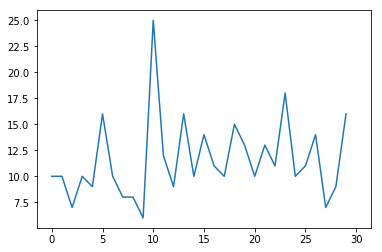

Observations: 32
Training Observations: 31
Testing Observations: 1


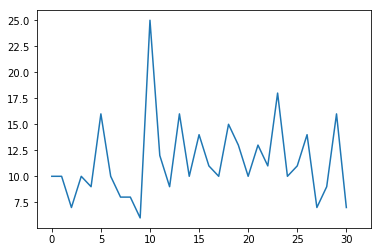

Observations: 33
Training Observations: 32
Testing Observations: 1


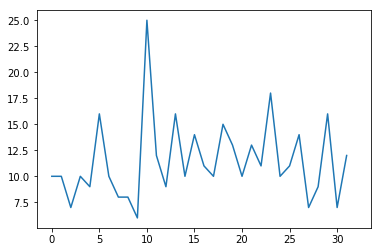

Observations: 34
Training Observations: 33
Testing Observations: 1


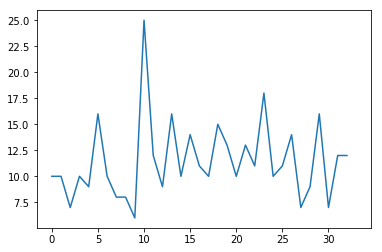

Observations: 35
Training Observations: 34
Testing Observations: 1


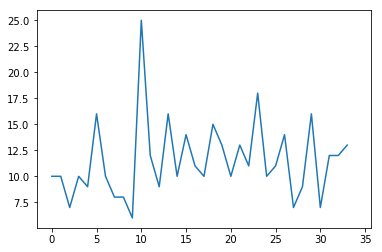

Observations: 36
Training Observations: 35
Testing Observations: 1


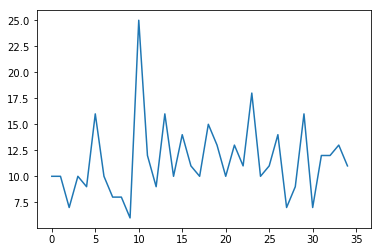

Observations: 37
Training Observations: 36
Testing Observations: 1


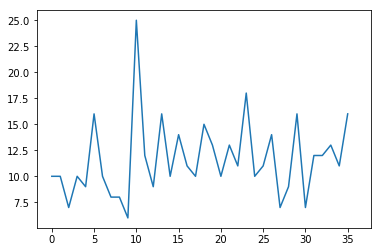

Observations: 38
Training Observations: 37
Testing Observations: 1


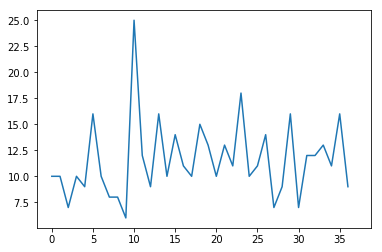

Observations: 39
Training Observations: 38
Testing Observations: 1


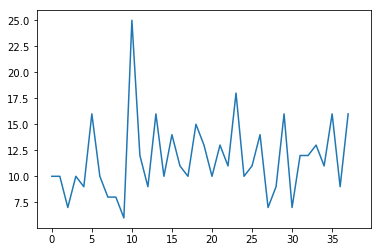

Observations: 40
Training Observations: 39
Testing Observations: 1


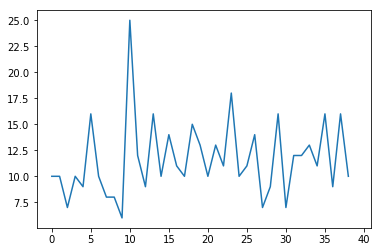

Observations: 41
Training Observations: 40
Testing Observations: 1


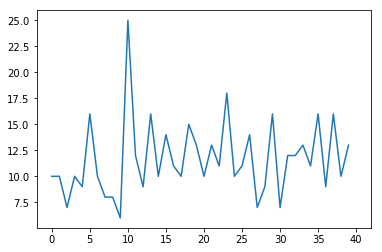

Observations: 42
Training Observations: 41
Testing Observations: 1


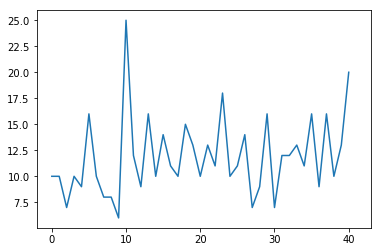

Observations: 43
Training Observations: 42
Testing Observations: 1


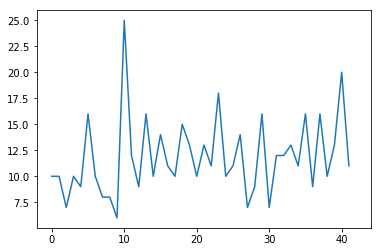

Observations: 44
Training Observations: 43
Testing Observations: 1


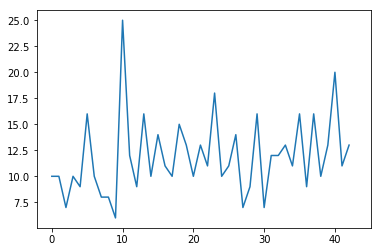

Observations: 45
Training Observations: 44
Testing Observations: 1


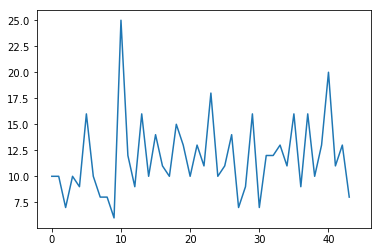

Observations: 46
Training Observations: 45
Testing Observations: 1


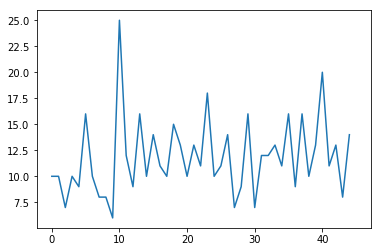

Observations: 47
Training Observations: 46
Testing Observations: 1


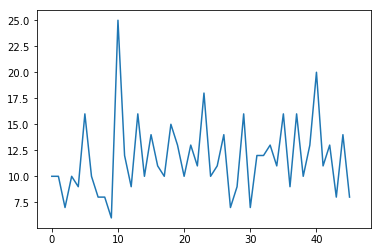

Observations: 48
Training Observations: 47
Testing Observations: 1


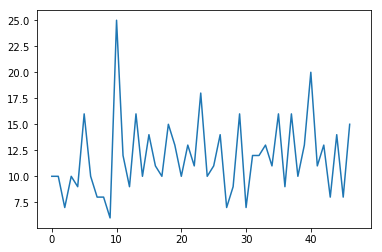

Observations: 49
Training Observations: 48
Testing Observations: 1


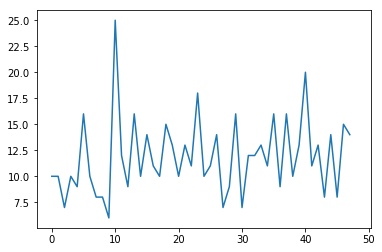

Observations: 50
Training Observations: 49
Testing Observations: 1


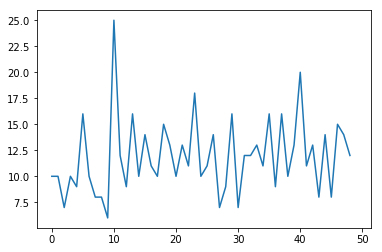

Observations: 51
Training Observations: 50
Testing Observations: 1


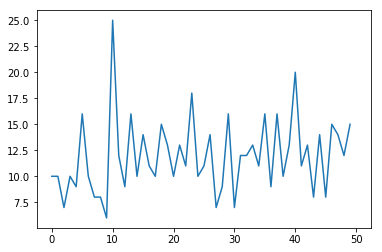

Observations: 52
Training Observations: 51
Testing Observations: 1


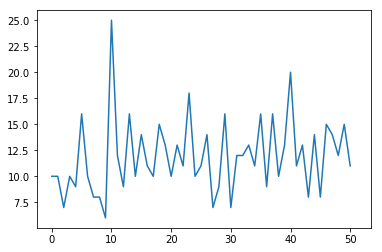

Observations: 53
Training Observations: 52
Testing Observations: 1


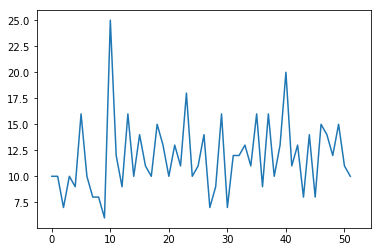

Observations: 54
Training Observations: 53
Testing Observations: 1


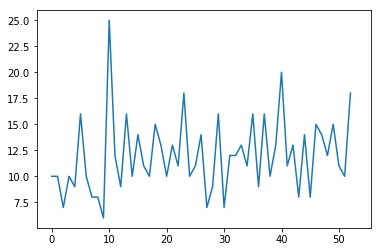

Observations: 55
Training Observations: 54
Testing Observations: 1


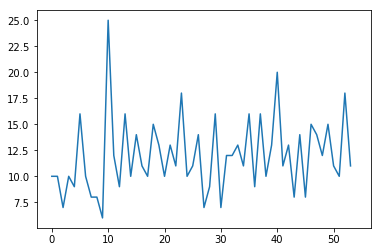

Observations: 56
Training Observations: 55
Testing Observations: 1


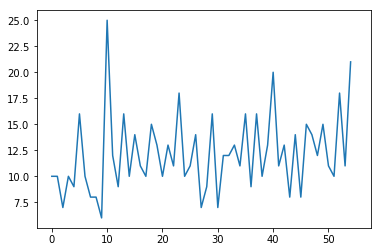

Observations: 57
Training Observations: 56
Testing Observations: 1


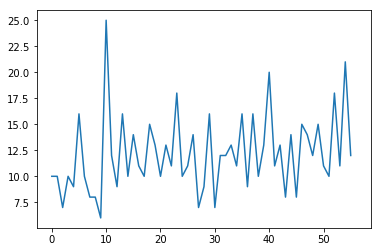

Observations: 58
Training Observations: 57
Testing Observations: 1


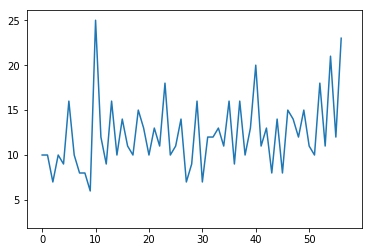

Observations: 59
Training Observations: 58
Testing Observations: 1


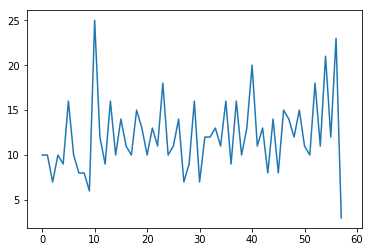

Observations: 60
Training Observations: 59
Testing Observations: 1


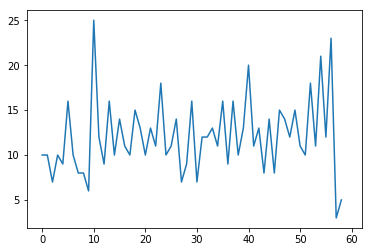

Observations: 61
Training Observations: 60
Testing Observations: 1


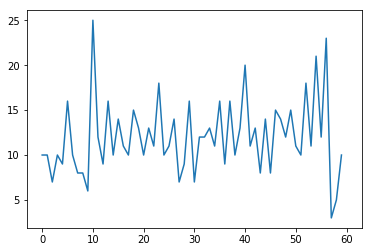

Observations: 62
Training Observations: 61
Testing Observations: 1


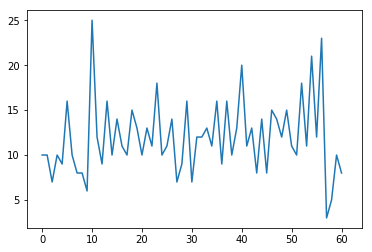

Observations: 63
Training Observations: 62
Testing Observations: 1


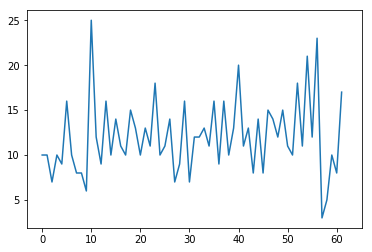

Observations: 64
Training Observations: 63
Testing Observations: 1


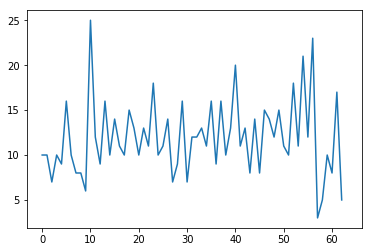

Observations: 65
Training Observations: 64
Testing Observations: 1


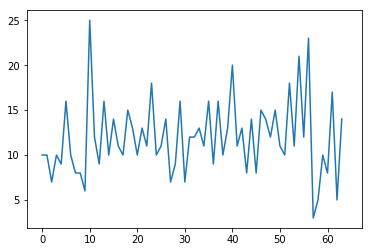

Observations: 66
Training Observations: 65
Testing Observations: 1


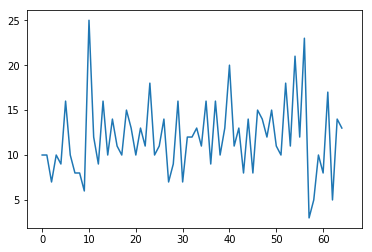

Observations: 67
Training Observations: 66
Testing Observations: 1


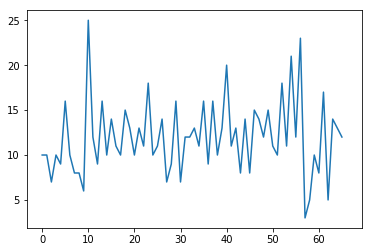

Observations: 68
Training Observations: 67
Testing Observations: 1


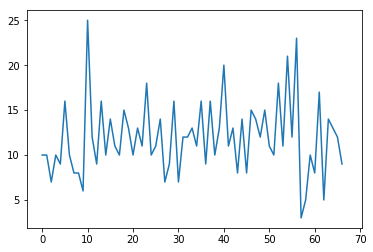

Observations: 69
Training Observations: 68
Testing Observations: 1


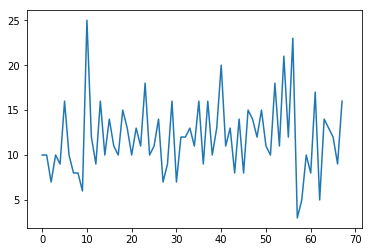

Observations: 70
Training Observations: 69
Testing Observations: 1


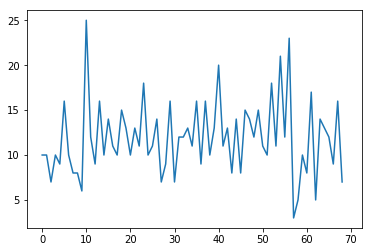

Observations: 71
Training Observations: 70
Testing Observations: 1


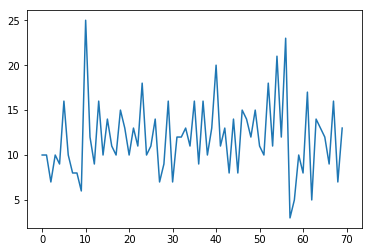

Observations: 72
Training Observations: 71
Testing Observations: 1


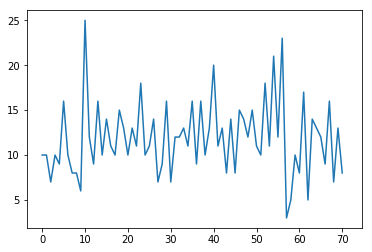

Observations: 73
Training Observations: 72
Testing Observations: 1


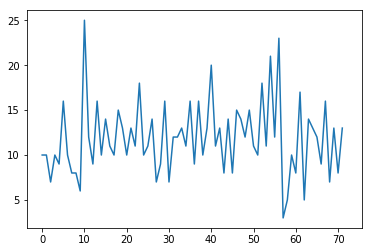

Observations: 74
Training Observations: 73
Testing Observations: 1


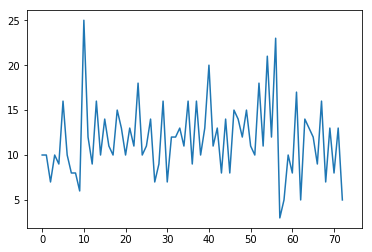

Observations: 75
Training Observations: 74
Testing Observations: 1


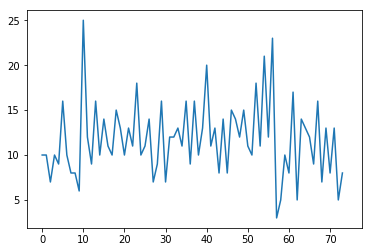

Observations: 76
Training Observations: 75
Testing Observations: 1


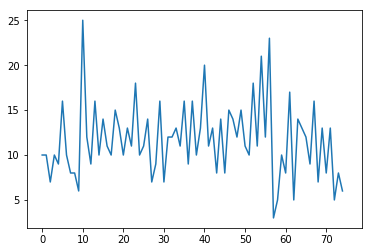

Observations: 77
Training Observations: 76
Testing Observations: 1


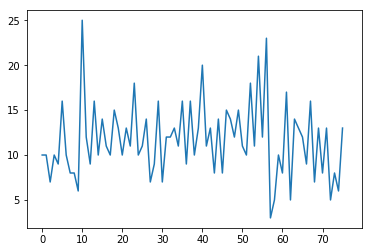

Observations: 78
Training Observations: 77
Testing Observations: 1


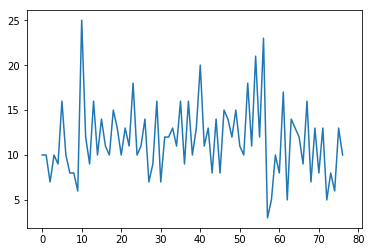

Observations: 79
Training Observations: 78
Testing Observations: 1


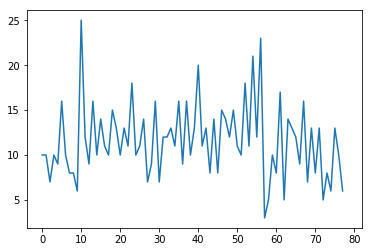

Observations: 80
Training Observations: 79
Testing Observations: 1


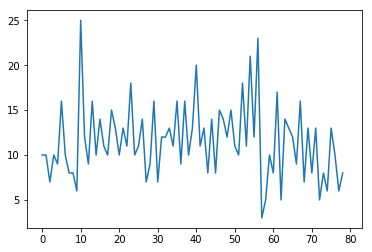

Observations: 81
Training Observations: 80
Testing Observations: 1


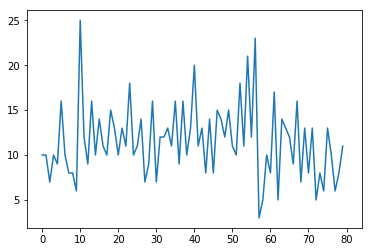

Observations: 82
Training Observations: 81
Testing Observations: 1


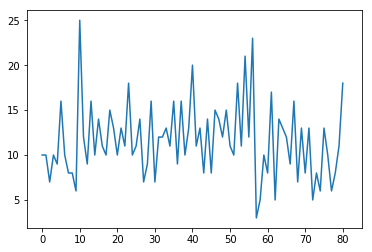

Observations: 83
Training Observations: 82
Testing Observations: 1


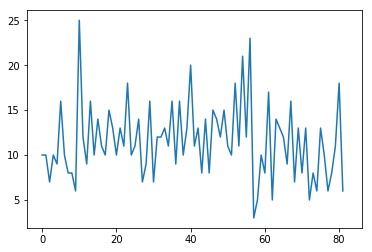

Observations: 84
Training Observations: 83
Testing Observations: 1


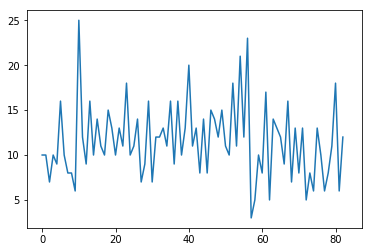

Observations: 85
Training Observations: 84
Testing Observations: 1


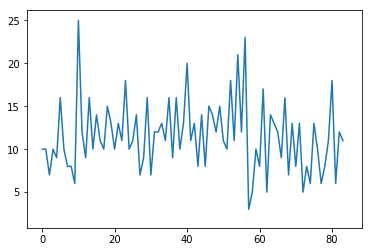

Observations: 86
Training Observations: 85
Testing Observations: 1


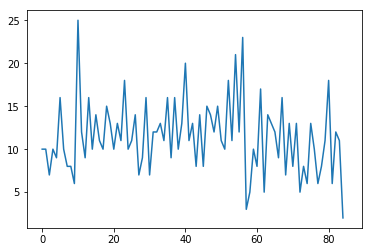

Observations: 87
Training Observations: 86
Testing Observations: 1


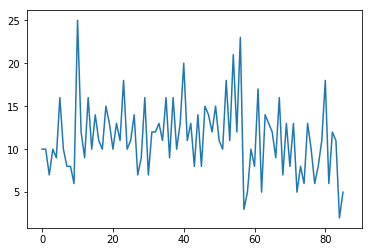

Observations: 88
Training Observations: 87
Testing Observations: 1


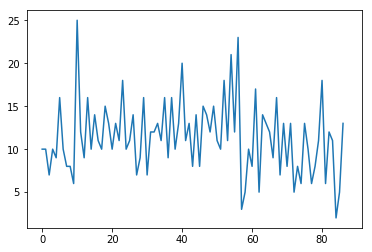

Observations: 89
Training Observations: 88
Testing Observations: 1


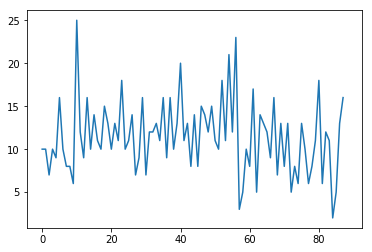

Observations: 90
Training Observations: 89
Testing Observations: 1


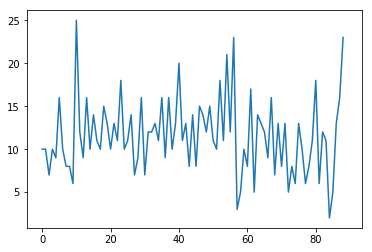

Observations: 91
Training Observations: 90
Testing Observations: 1


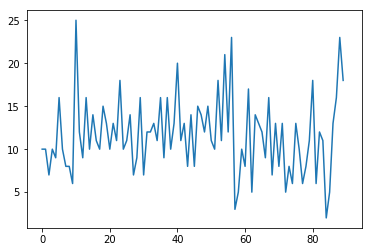

Observations: 92
Training Observations: 91
Testing Observations: 1


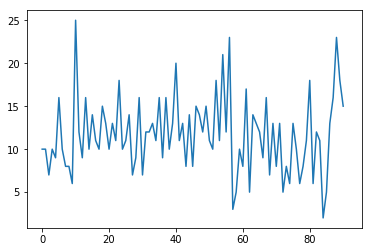

Observations: 93
Training Observations: 92
Testing Observations: 1


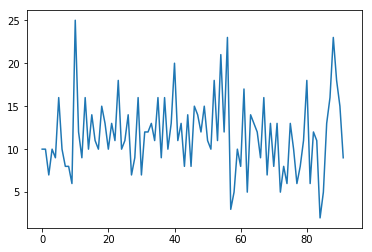

Observations: 94
Training Observations: 93
Testing Observations: 1


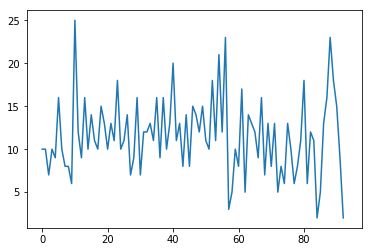

Observations: 95
Training Observations: 94
Testing Observations: 1


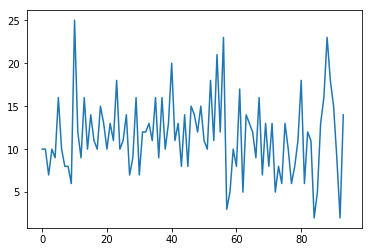

Observations: 96
Training Observations: 95
Testing Observations: 1


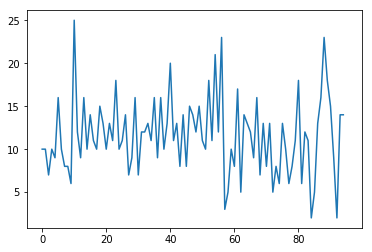

Observations: 97
Training Observations: 96
Testing Observations: 1


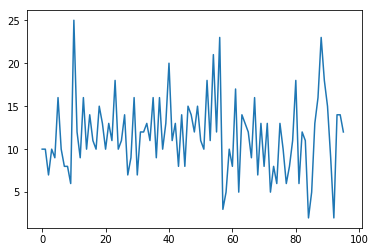

Observations: 98
Training Observations: 97
Testing Observations: 1


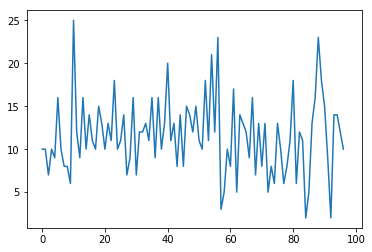

Observations: 99
Training Observations: 98
Testing Observations: 1


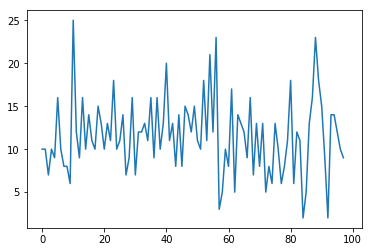

Observations: 100
Training Observations: 99
Testing Observations: 1


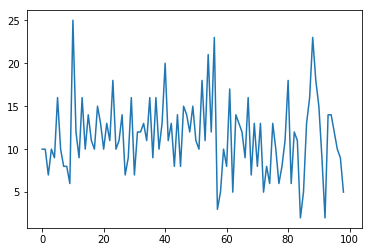

Observations: 101
Training Observations: 100
Testing Observations: 1


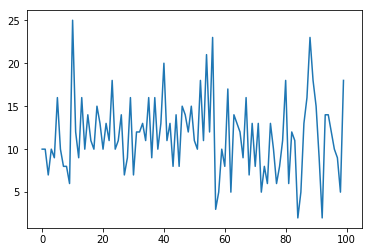

Observations: 102
Training Observations: 101
Testing Observations: 1


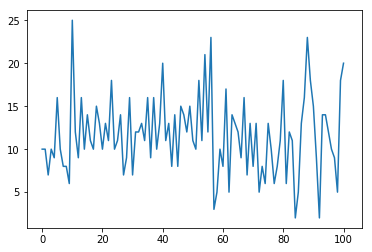

Observations: 103
Training Observations: 102
Testing Observations: 1


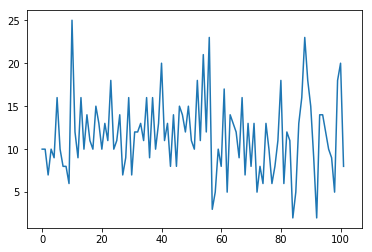

Observations: 104
Training Observations: 103
Testing Observations: 1


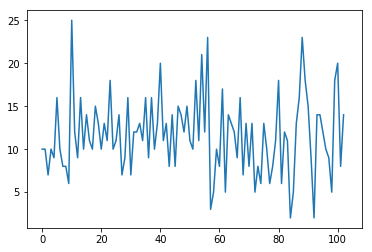

Observations: 105
Training Observations: 104
Testing Observations: 1


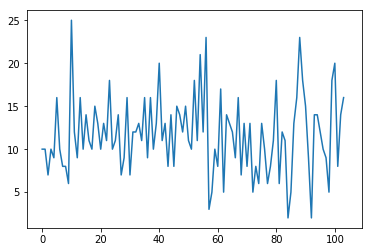

Observations: 106
Training Observations: 105
Testing Observations: 1


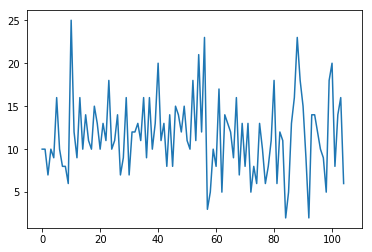

Observations: 107
Training Observations: 106
Testing Observations: 1


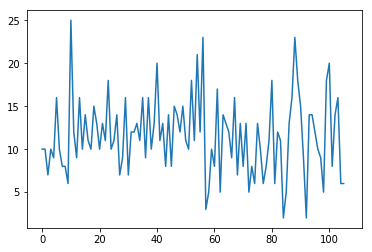

Observations: 108
Training Observations: 107
Testing Observations: 1


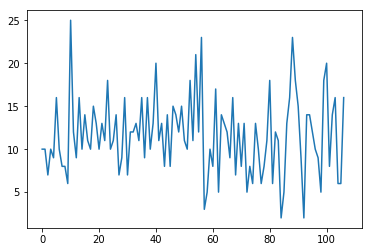

Observations: 109
Training Observations: 108
Testing Observations: 1


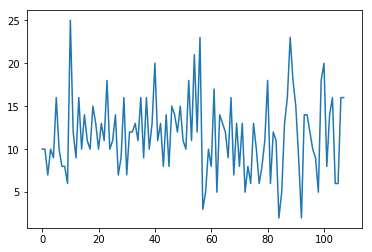

Observations: 110
Training Observations: 109
Testing Observations: 1


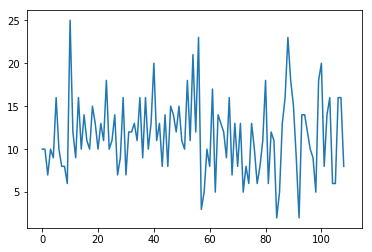

Observations: 111
Training Observations: 110
Testing Observations: 1


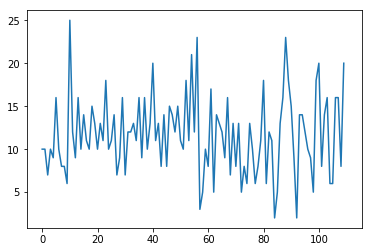

Observations: 112
Training Observations: 111
Testing Observations: 1


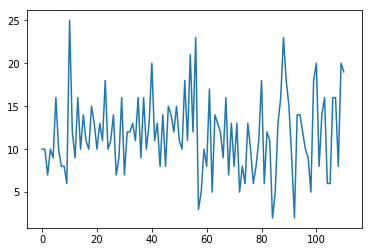

Observations: 113
Training Observations: 112
Testing Observations: 1


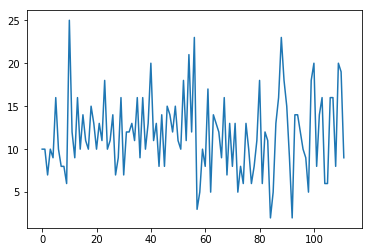

Observations: 114
Training Observations: 113
Testing Observations: 1


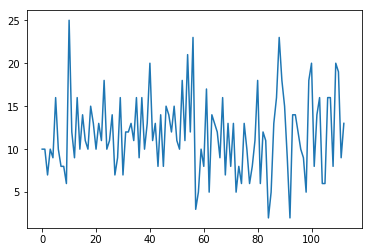

Observations: 115
Training Observations: 114
Testing Observations: 1


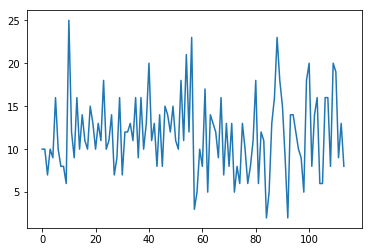

Observations: 116
Training Observations: 115
Testing Observations: 1


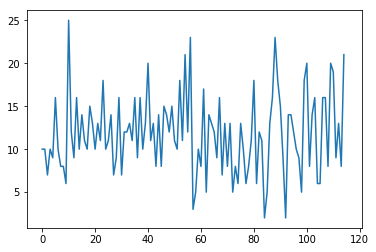

Observations: 117
Training Observations: 116
Testing Observations: 1


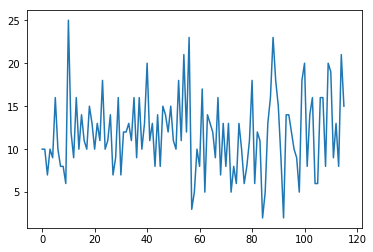

Observations: 118
Training Observations: 117
Testing Observations: 1


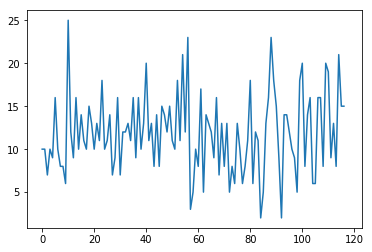

Observations: 119
Training Observations: 118
Testing Observations: 1


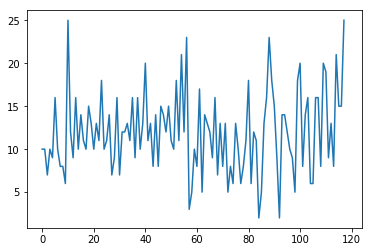

Observations: 120
Training Observations: 119
Testing Observations: 1


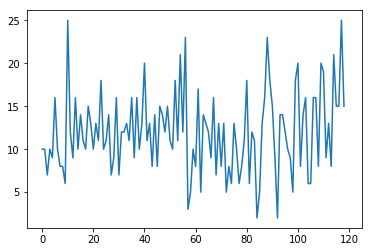

Observations: 121
Training Observations: 120
Testing Observations: 1


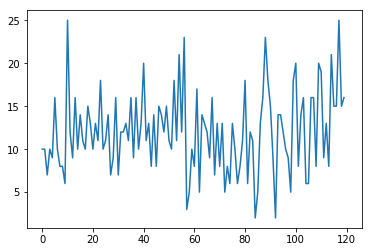

Observations: 122
Training Observations: 121
Testing Observations: 1


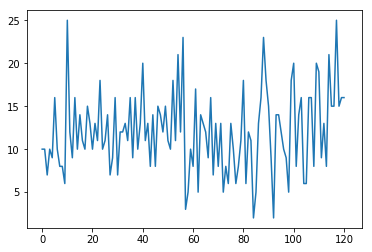

Observations: 123
Training Observations: 122
Testing Observations: 1


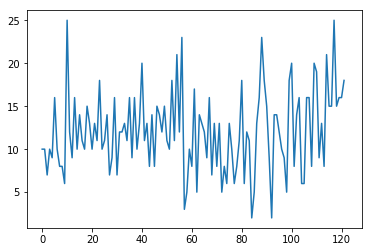

Observations: 124
Training Observations: 123
Testing Observations: 1


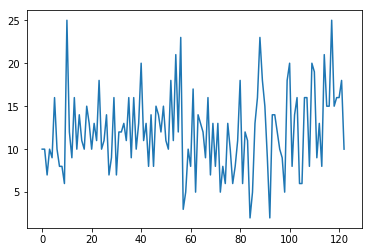

Observations: 125
Training Observations: 124
Testing Observations: 1


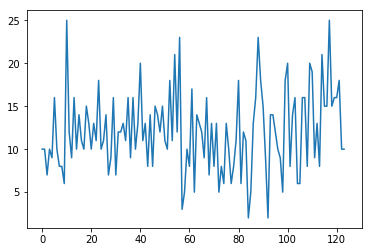

Observations: 126
Training Observations: 125
Testing Observations: 1


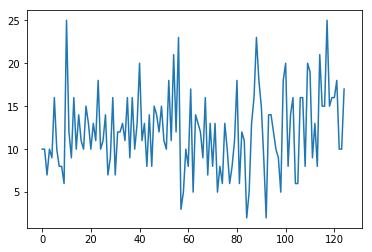

Observations: 127
Training Observations: 126
Testing Observations: 1


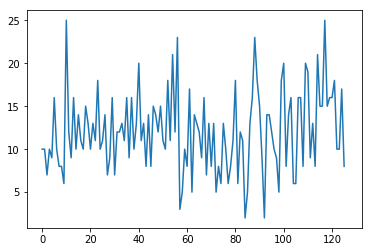

Observations: 128
Training Observations: 127
Testing Observations: 1


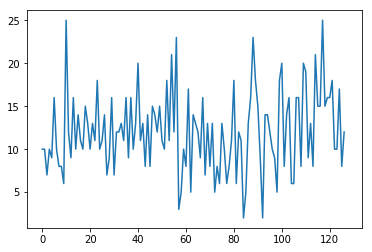

Observations: 129
Training Observations: 128
Testing Observations: 1


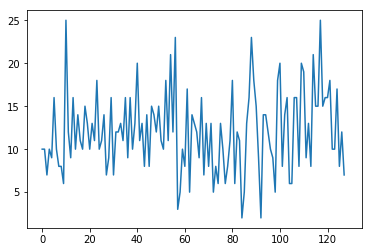

Observations: 130
Training Observations: 129
Testing Observations: 1


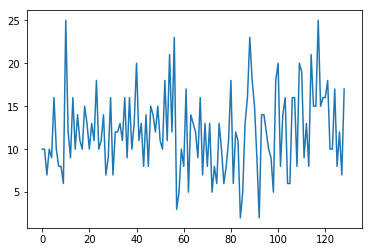

Observations: 131
Training Observations: 130
Testing Observations: 1


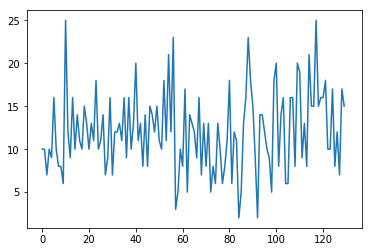

Observations: 132
Training Observations: 131
Testing Observations: 1


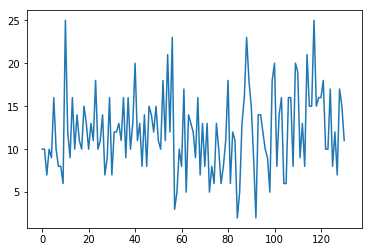

Observations: 133
Training Observations: 132
Testing Observations: 1


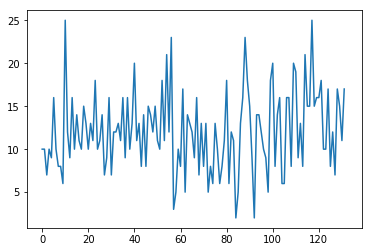

Observations: 134
Training Observations: 133
Testing Observations: 1


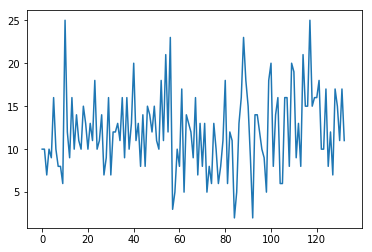

Observations: 135
Training Observations: 134
Testing Observations: 1


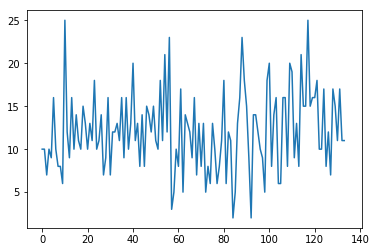

Observations: 136
Training Observations: 135
Testing Observations: 1


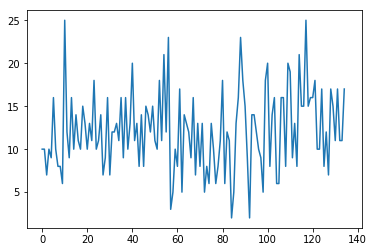

Observations: 137
Training Observations: 136
Testing Observations: 1


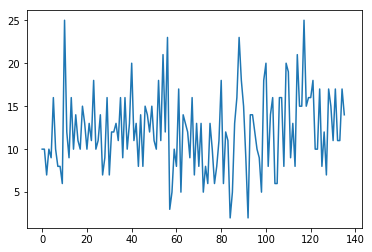

Observations: 138
Training Observations: 137
Testing Observations: 1


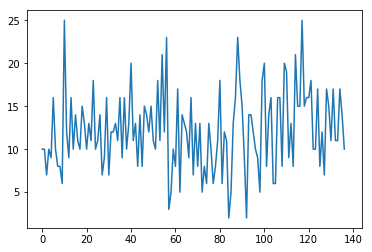

Observations: 139
Training Observations: 138
Testing Observations: 1


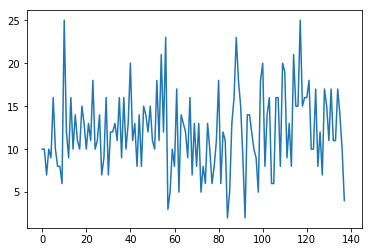

Observations: 140
Training Observations: 139
Testing Observations: 1


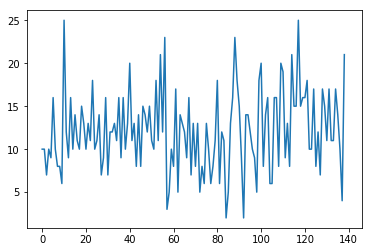

Observations: 141
Training Observations: 140
Testing Observations: 1


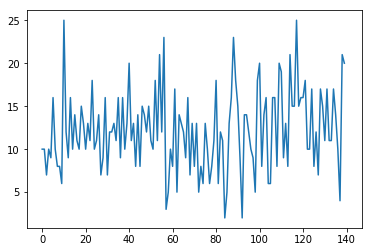

Observations: 142
Training Observations: 141
Testing Observations: 1


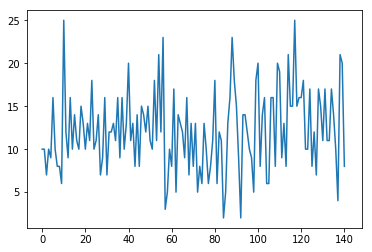

Observations: 143
Training Observations: 142
Testing Observations: 1


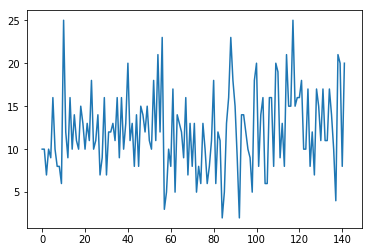

Observations: 144
Training Observations: 143
Testing Observations: 1


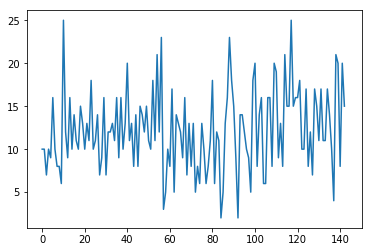

Observations: 145
Training Observations: 144
Testing Observations: 1


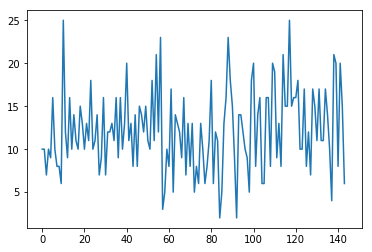

Observations: 146
Training Observations: 145
Testing Observations: 1


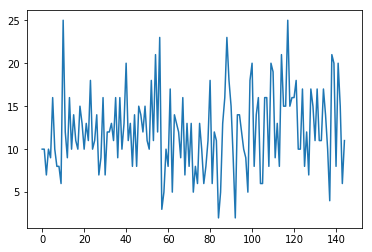

Observations: 147
Training Observations: 146
Testing Observations: 1


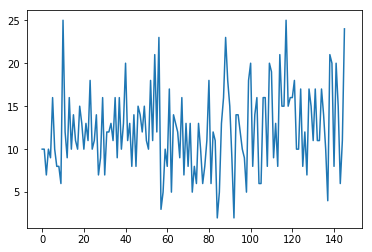

Observations: 148
Training Observations: 147
Testing Observations: 1


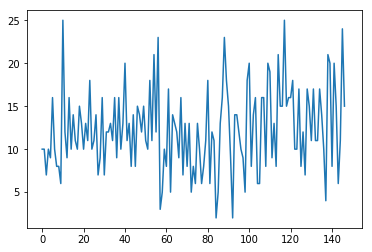

Observations: 149
Training Observations: 148
Testing Observations: 1


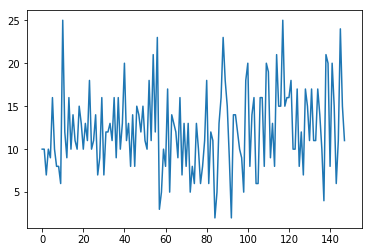

Observations: 150
Training Observations: 149
Testing Observations: 1


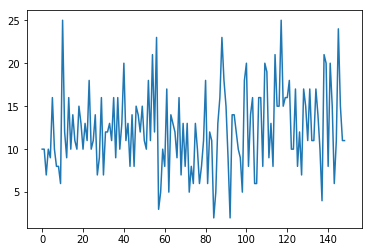

Observations: 151
Training Observations: 150
Testing Observations: 1


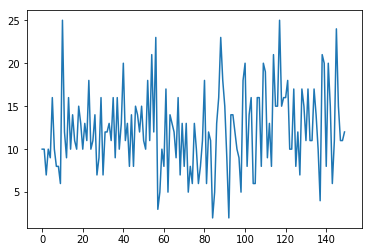

Observations: 152
Training Observations: 151
Testing Observations: 1


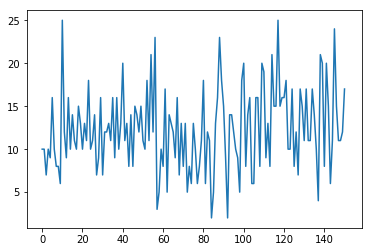

Observations: 153
Training Observations: 152
Testing Observations: 1


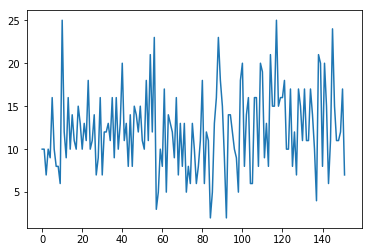

Observations: 154
Training Observations: 153
Testing Observations: 1


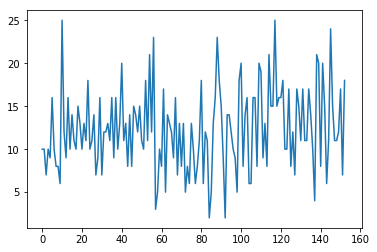

Observations: 155
Training Observations: 154
Testing Observations: 1


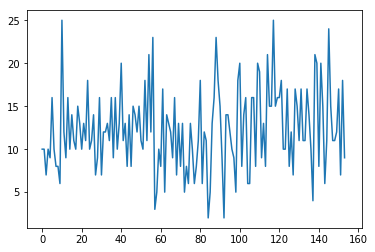

Observations: 156
Training Observations: 155
Testing Observations: 1


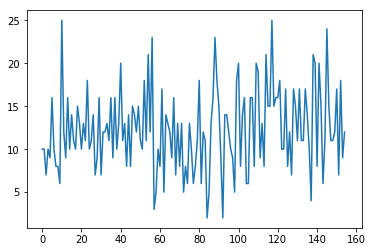

Observations: 157
Training Observations: 156
Testing Observations: 1


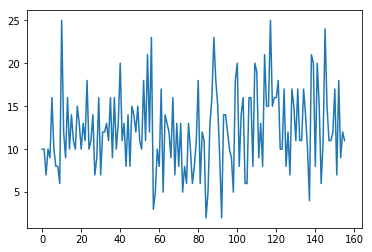

Observations: 158
Training Observations: 157
Testing Observations: 1


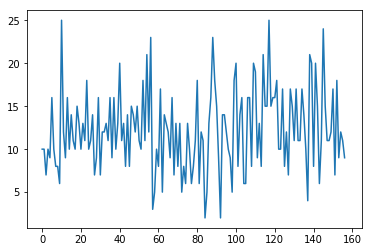

Observations: 159
Training Observations: 158
Testing Observations: 1


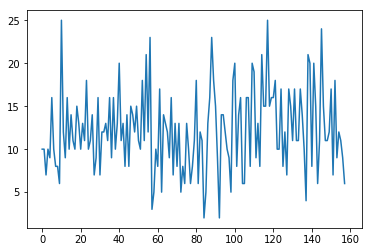

Observations: 160
Training Observations: 159
Testing Observations: 1


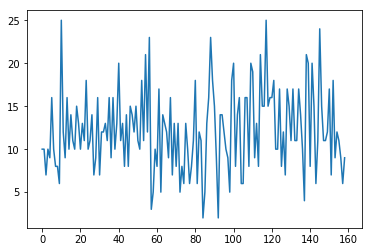

Observations: 161
Training Observations: 160
Testing Observations: 1


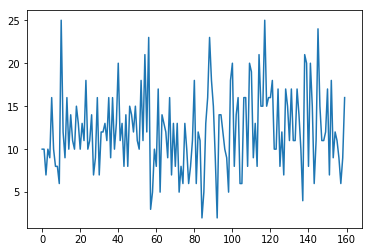

Observations: 162
Training Observations: 161
Testing Observations: 1


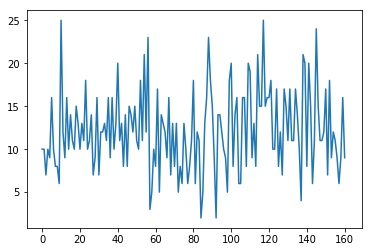

Observations: 163
Training Observations: 162
Testing Observations: 1


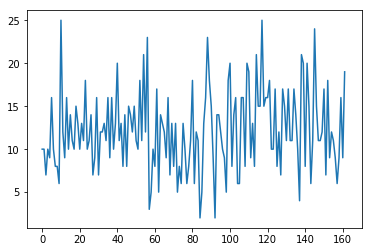

Observations: 164
Training Observations: 163
Testing Observations: 1


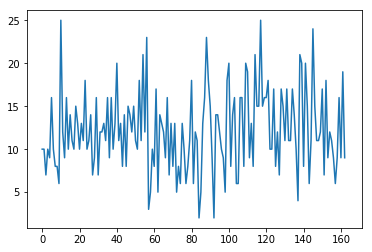

Observations: 165
Training Observations: 164
Testing Observations: 1


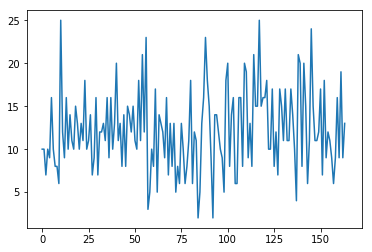

Observations: 166
Training Observations: 165
Testing Observations: 1


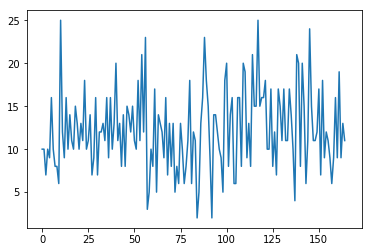

Observations: 167
Training Observations: 166
Testing Observations: 1


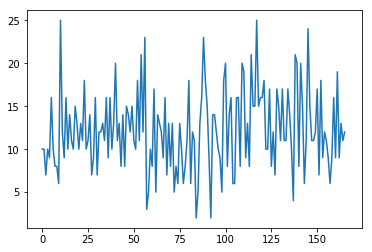

Observations: 168
Training Observations: 167
Testing Observations: 1


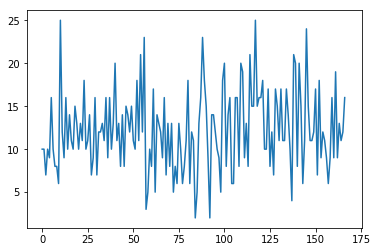

Observations: 169
Training Observations: 168
Testing Observations: 1


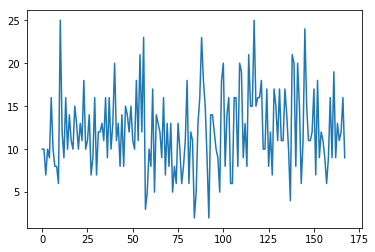

Observations: 170
Training Observations: 169
Testing Observations: 1


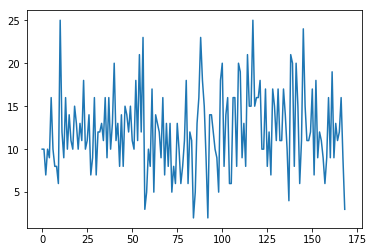

Observations: 171
Training Observations: 170
Testing Observations: 1


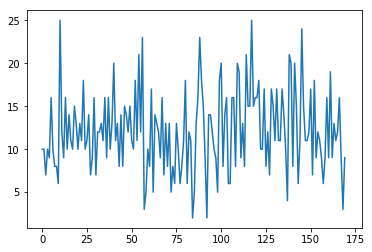

Observations: 172
Training Observations: 171
Testing Observations: 1


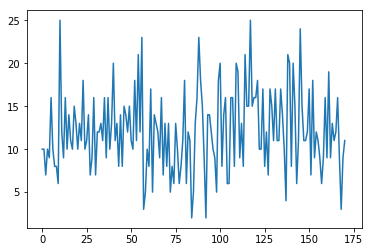

Observations: 173
Training Observations: 172
Testing Observations: 1


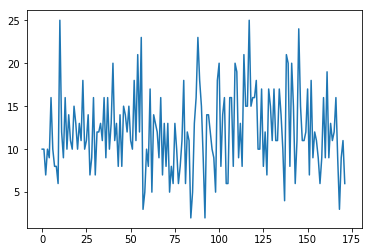

Observations: 174
Training Observations: 173
Testing Observations: 1


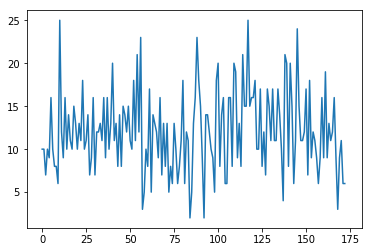

Observations: 175
Training Observations: 174
Testing Observations: 1


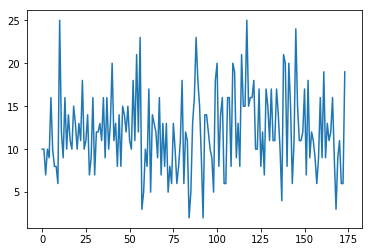

Observations: 176
Training Observations: 175
Testing Observations: 1


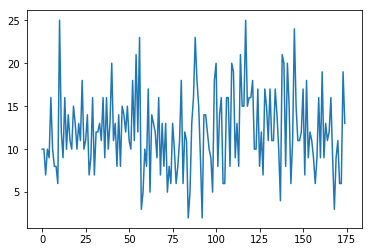

Observations: 177
Training Observations: 176
Testing Observations: 1


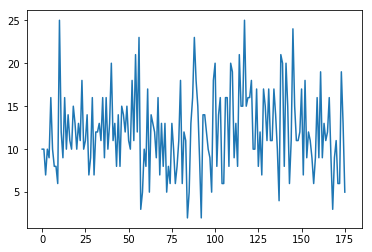

Observations: 178
Training Observations: 177
Testing Observations: 1


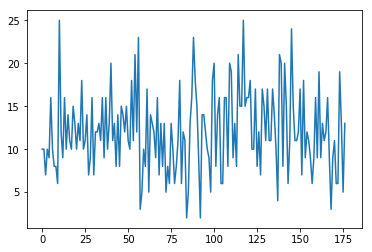

Observations: 179
Training Observations: 178
Testing Observations: 1


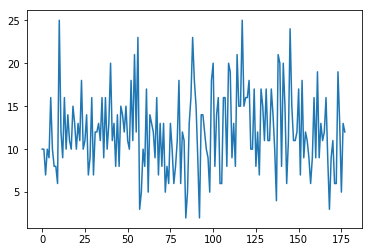

Observations: 180
Training Observations: 179
Testing Observations: 1


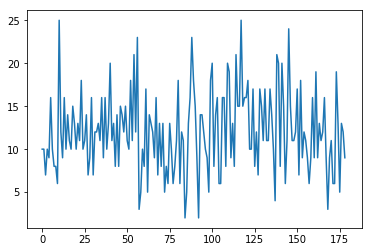

Observations: 181
Training Observations: 180
Testing Observations: 1


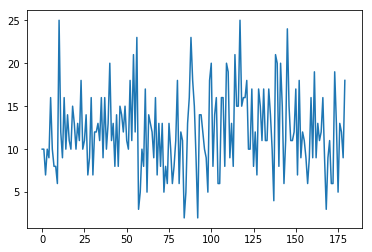

Observations: 182
Training Observations: 181
Testing Observations: 1


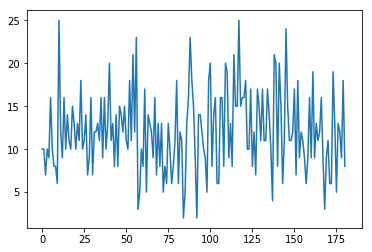

Observations: 183
Training Observations: 182
Testing Observations: 1


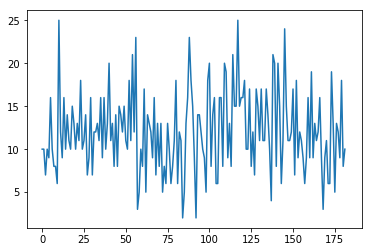

Observations: 184
Training Observations: 183
Testing Observations: 1


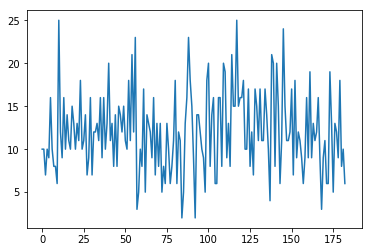

Observations: 185
Training Observations: 184
Testing Observations: 1


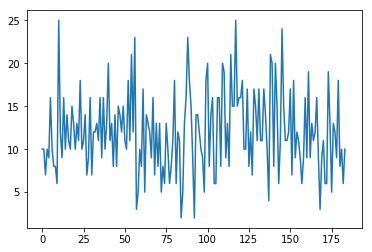

Observations: 186
Training Observations: 185
Testing Observations: 1


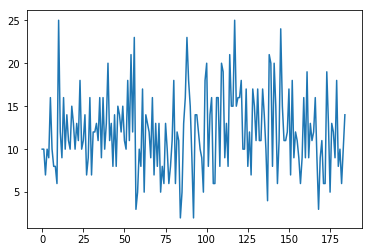

Observations: 187
Training Observations: 186
Testing Observations: 1


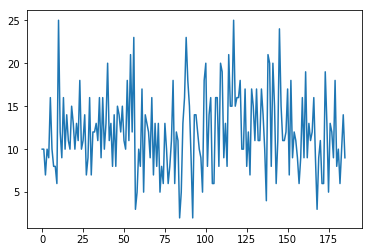

Observations: 188
Training Observations: 187
Testing Observations: 1


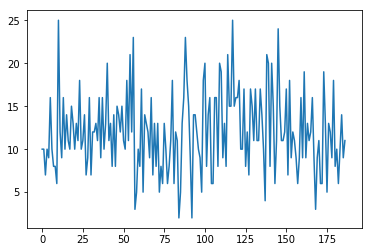

Observations: 189
Training Observations: 188
Testing Observations: 1


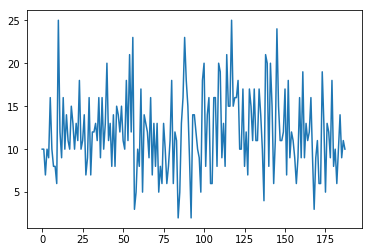

Observations: 190
Training Observations: 189
Testing Observations: 1


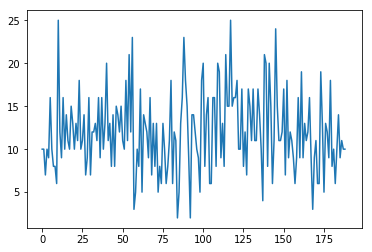

Observations: 191
Training Observations: 190
Testing Observations: 1


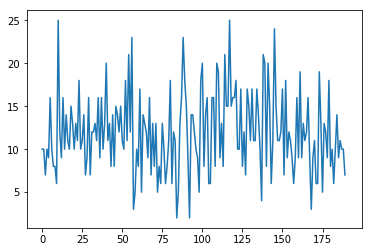

Observations: 192
Training Observations: 191
Testing Observations: 1


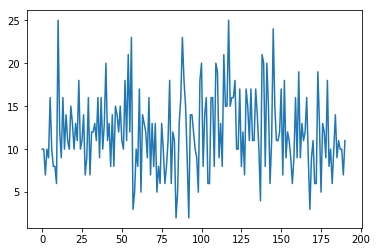

Observations: 193
Training Observations: 192
Testing Observations: 1


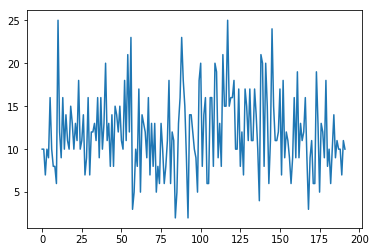

Observations: 194
Training Observations: 193
Testing Observations: 1


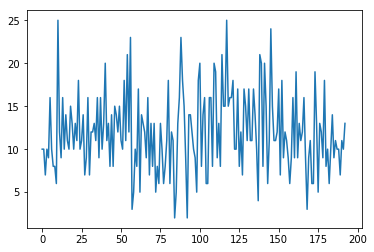

Observations: 195
Training Observations: 194
Testing Observations: 1


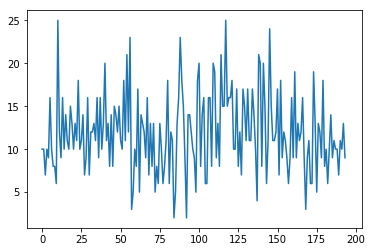

Observations: 196
Training Observations: 195
Testing Observations: 1


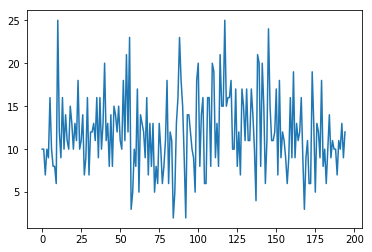

Observations: 197
Training Observations: 196
Testing Observations: 1


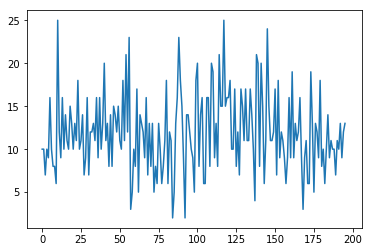

Observations: 198
Training Observations: 197
Testing Observations: 1


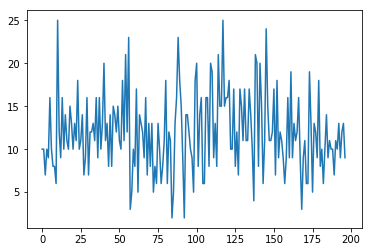

Observations: 199
Training Observations: 198
Testing Observations: 1


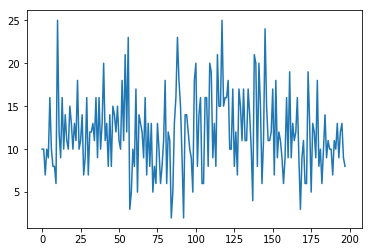

Observations: 200
Training Observations: 199
Testing Observations: 1


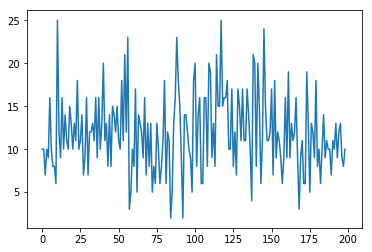

Observations: 201
Training Observations: 200
Testing Observations: 1


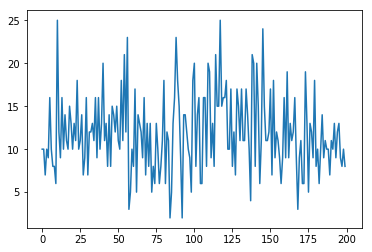

Observations: 202
Training Observations: 201
Testing Observations: 1


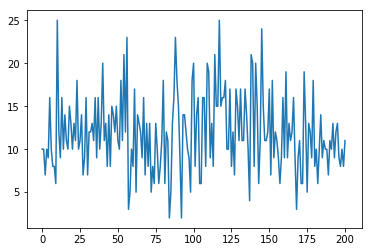

Observations: 203
Training Observations: 202
Testing Observations: 1


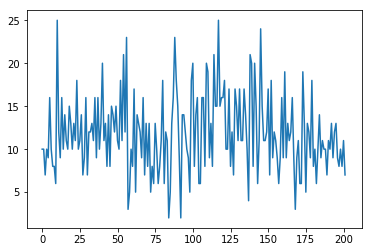

Observations: 204
Training Observations: 203
Testing Observations: 1


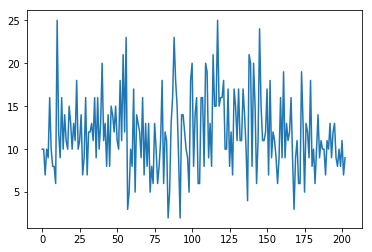

Observations: 205
Training Observations: 204
Testing Observations: 1


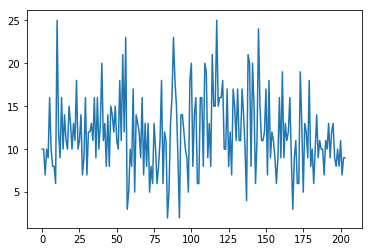

Observations: 206
Training Observations: 205
Testing Observations: 1


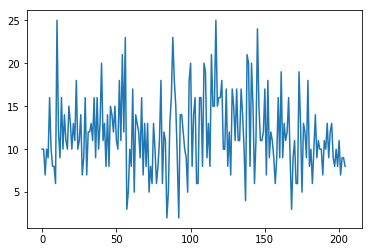

Observations: 207
Training Observations: 206
Testing Observations: 1


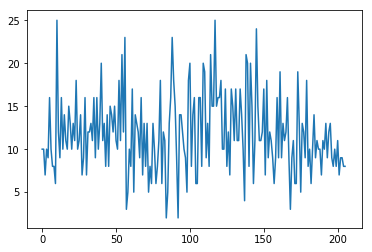

Observations: 208
Training Observations: 207
Testing Observations: 1


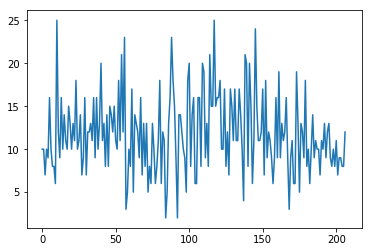

Observations: 209
Training Observations: 208
Testing Observations: 1


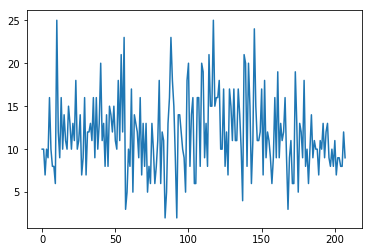

Observations: 210
Training Observations: 209
Testing Observations: 1


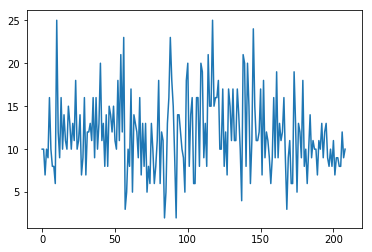

Observations: 211
Training Observations: 210
Testing Observations: 1


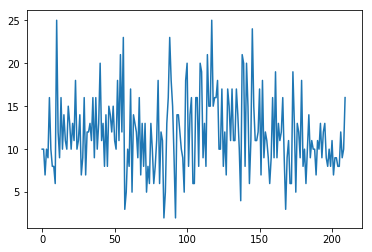

Observations: 212
Training Observations: 211
Testing Observations: 1


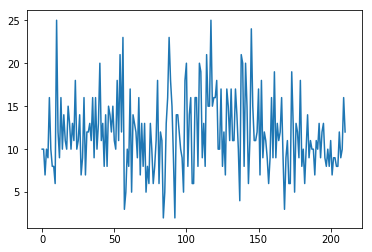

Observations: 213
Training Observations: 212
Testing Observations: 1


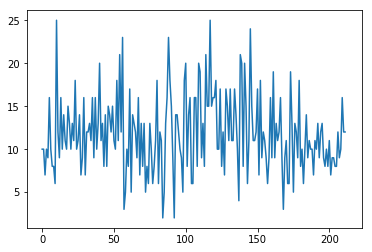

Observations: 214
Training Observations: 213
Testing Observations: 1


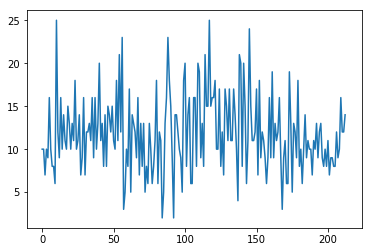

Observations: 215
Training Observations: 214
Testing Observations: 1


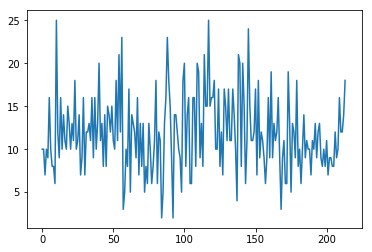

Observations: 216
Training Observations: 215
Testing Observations: 1


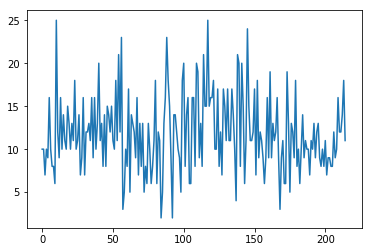

Observations: 217
Training Observations: 216
Testing Observations: 1


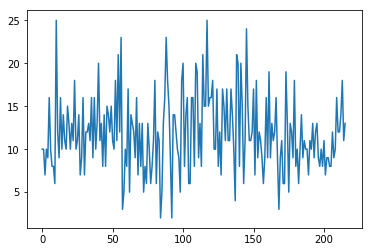

Observations: 218
Training Observations: 217
Testing Observations: 1


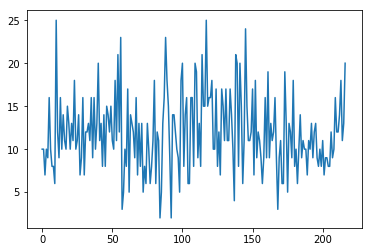

Observations: 219
Training Observations: 218
Testing Observations: 1


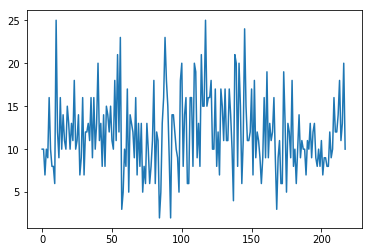

Observations: 220
Training Observations: 219
Testing Observations: 1


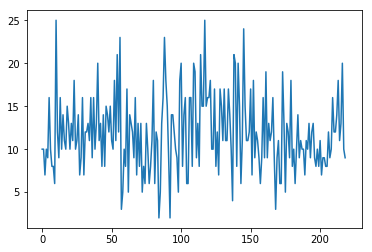

Observations: 221
Training Observations: 220
Testing Observations: 1


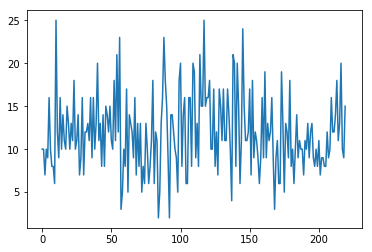

Observations: 222
Training Observations: 221
Testing Observations: 1


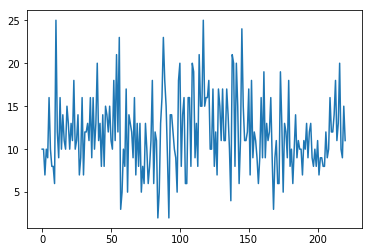

Observations: 223
Training Observations: 222
Testing Observations: 1


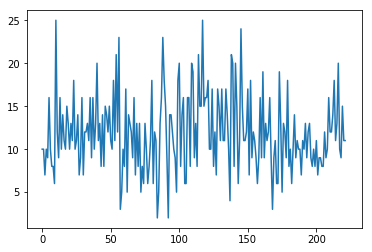

Observations: 224
Training Observations: 223
Testing Observations: 1


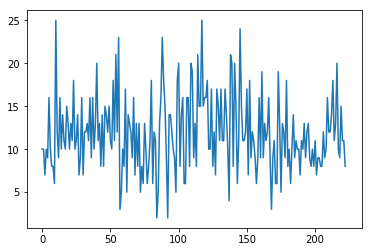

Observations: 225
Training Observations: 224
Testing Observations: 1


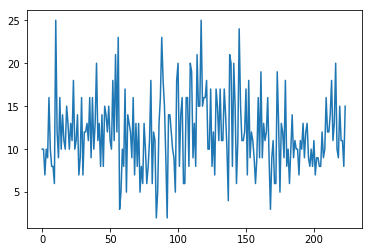

Observations: 226
Training Observations: 225
Testing Observations: 1


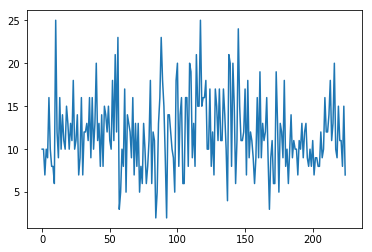

Observations: 227
Training Observations: 226
Testing Observations: 1


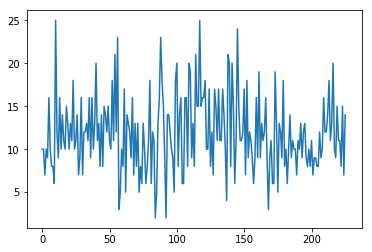

Observations: 228
Training Observations: 227
Testing Observations: 1


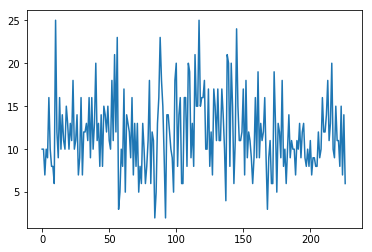

Observations: 229
Training Observations: 228
Testing Observations: 1


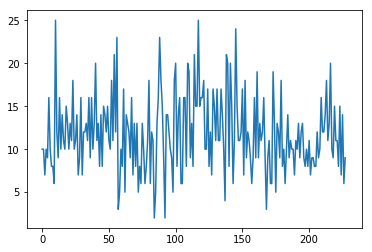

Observations: 230
Training Observations: 229
Testing Observations: 1


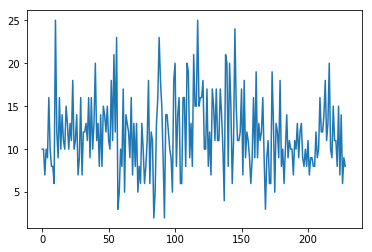

Observations: 231
Training Observations: 230
Testing Observations: 1


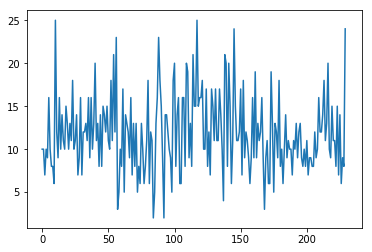

Observations: 232
Training Observations: 231
Testing Observations: 1


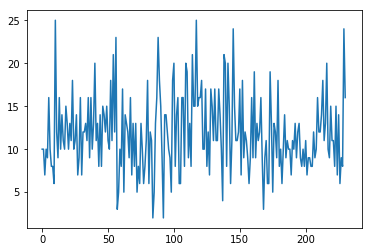

Observations: 233
Training Observations: 232
Testing Observations: 1


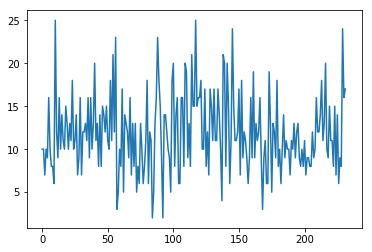

Observations: 234
Training Observations: 233
Testing Observations: 1


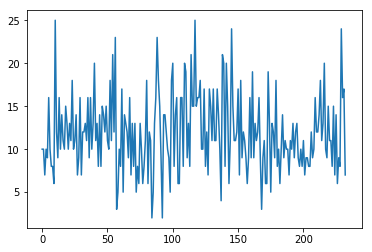

Observations: 235
Training Observations: 234
Testing Observations: 1


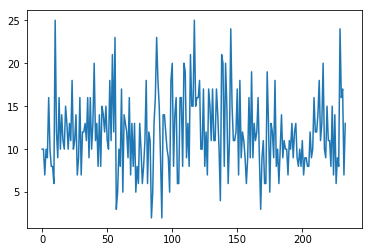

Observations: 236
Training Observations: 235
Testing Observations: 1


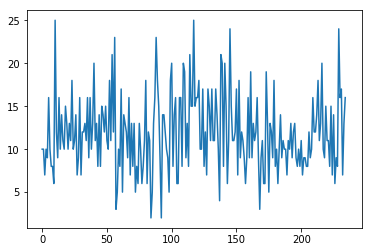

Observations: 237
Training Observations: 236
Testing Observations: 1


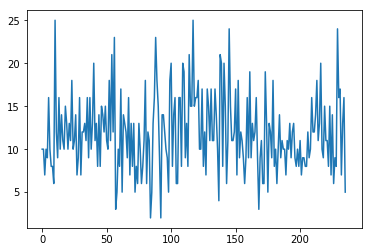

Observations: 238
Training Observations: 237
Testing Observations: 1


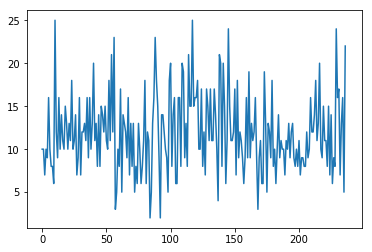

Observations: 239
Training Observations: 238
Testing Observations: 1


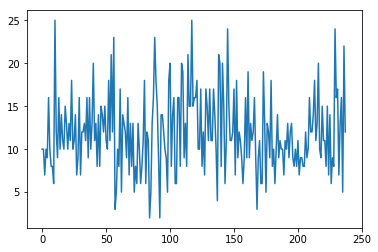

Observations: 240
Training Observations: 239
Testing Observations: 1


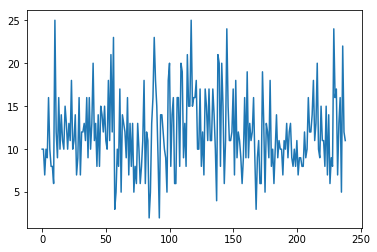

Observations: 241
Training Observations: 240
Testing Observations: 1


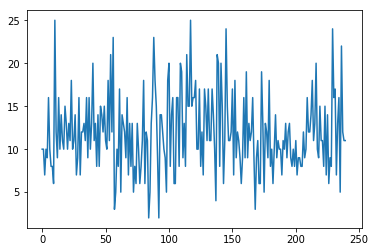

Observations: 242
Training Observations: 241
Testing Observations: 1


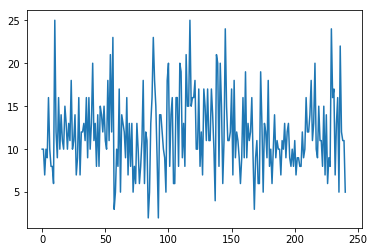

Observations: 243
Training Observations: 242
Testing Observations: 1


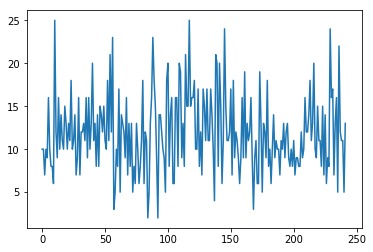

Observations: 244
Training Observations: 243
Testing Observations: 1


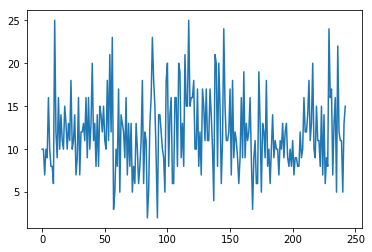

Observations: 245
Training Observations: 244
Testing Observations: 1


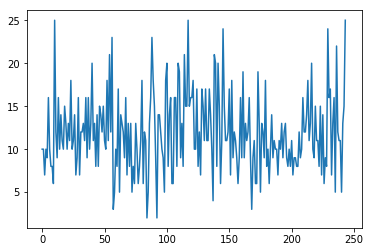

Observations: 246
Training Observations: 245
Testing Observations: 1


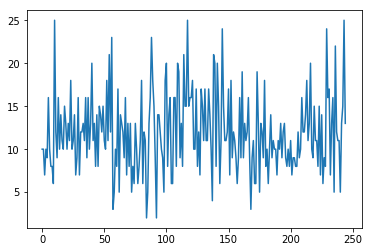

Observations: 247
Training Observations: 246
Testing Observations: 1


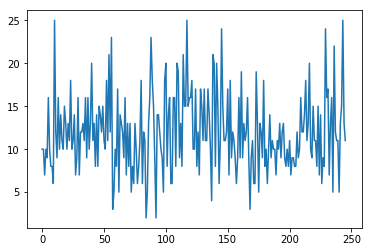

Observations: 248
Training Observations: 247
Testing Observations: 1


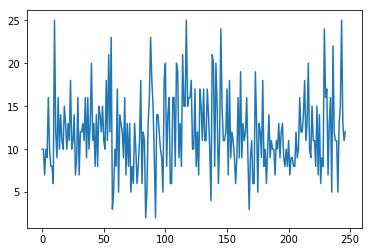

Observations: 249
Training Observations: 248
Testing Observations: 1


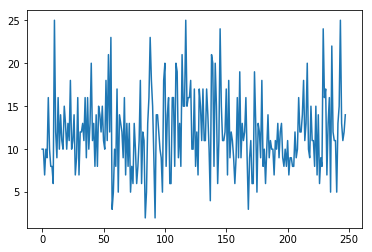

Observations: 250
Training Observations: 249
Testing Observations: 1


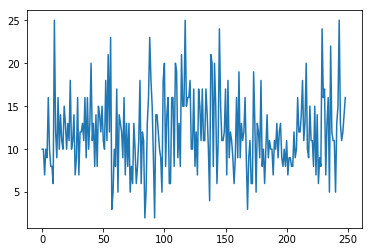

Observations: 251
Training Observations: 250
Testing Observations: 1


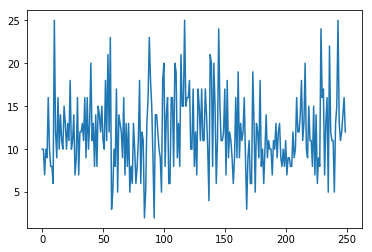

Observations: 252
Training Observations: 251
Testing Observations: 1


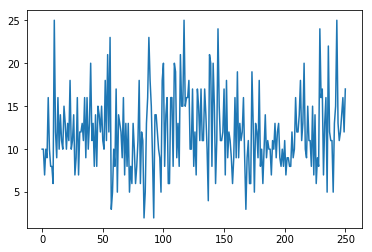

Observations: 253
Training Observations: 252
Testing Observations: 1


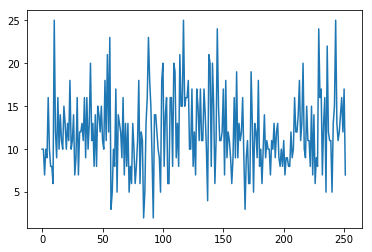

Observations: 254
Training Observations: 253
Testing Observations: 1


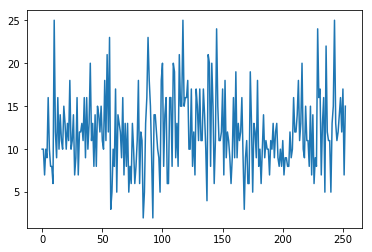

Observations: 255
Training Observations: 254
Testing Observations: 1


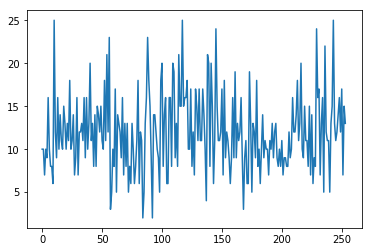

Observations: 256
Training Observations: 255
Testing Observations: 1


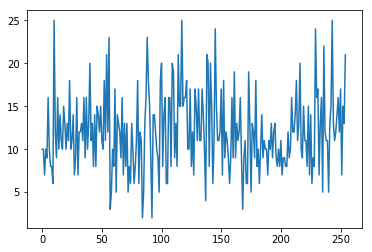

Observations: 257
Training Observations: 256
Testing Observations: 1


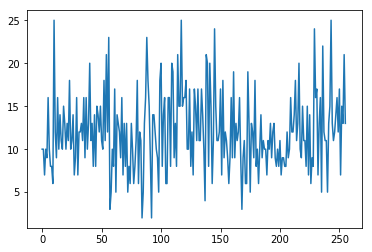

Observations: 258
Training Observations: 257
Testing Observations: 1


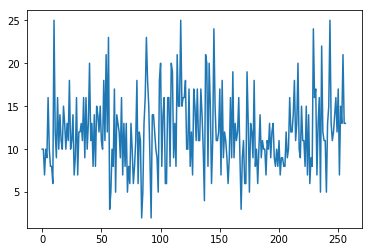

Observations: 259
Training Observations: 258
Testing Observations: 1


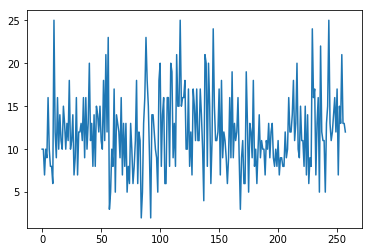

Observations: 260
Training Observations: 259
Testing Observations: 1


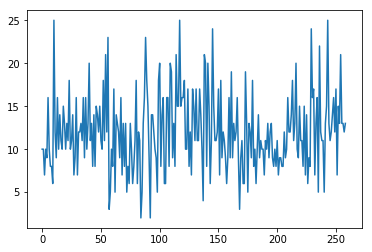

Observations: 261
Training Observations: 260
Testing Observations: 1


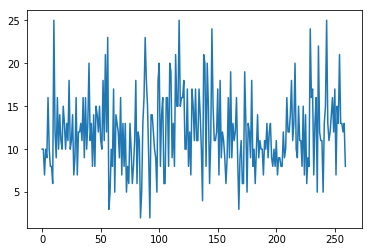

Observations: 262
Training Observations: 261
Testing Observations: 1


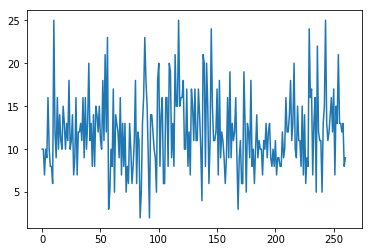

Observations: 263
Training Observations: 262
Testing Observations: 1


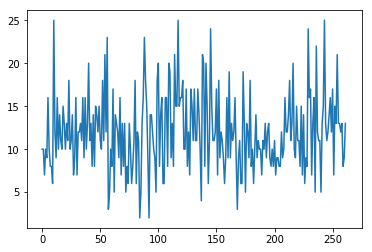

Observations: 264
Training Observations: 263
Testing Observations: 1


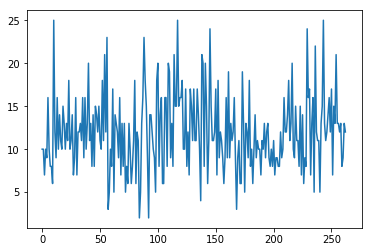

Observations: 265
Training Observations: 264
Testing Observations: 1


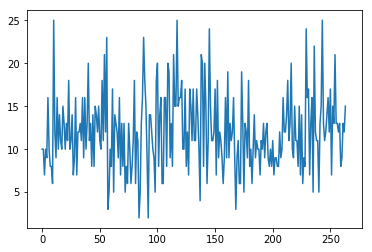

Observations: 266
Training Observations: 265
Testing Observations: 1


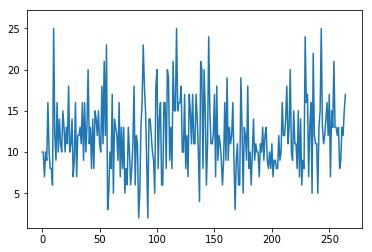

Observations: 267
Training Observations: 266
Testing Observations: 1


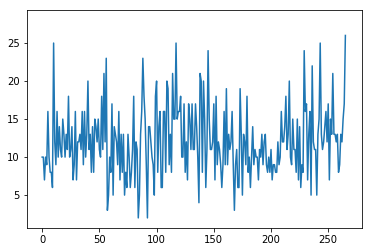

Observations: 268
Training Observations: 267
Testing Observations: 1


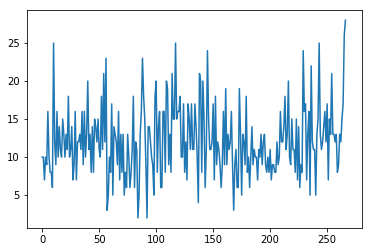

Observations: 269
Training Observations: 268
Testing Observations: 1


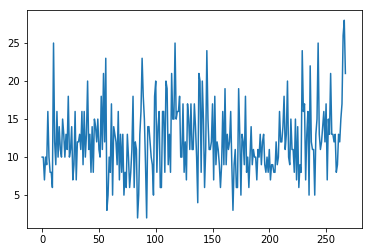

Observations: 270
Training Observations: 269
Testing Observations: 1


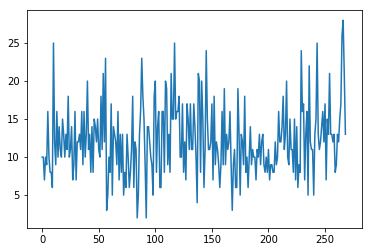

Observations: 271
Training Observations: 270
Testing Observations: 1


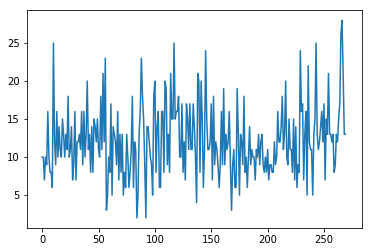

Observations: 272
Training Observations: 271
Testing Observations: 1


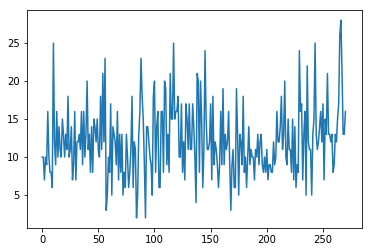

Observations: 273
Training Observations: 272
Testing Observations: 1


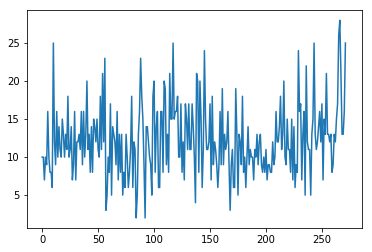

Observations: 274
Training Observations: 273
Testing Observations: 1


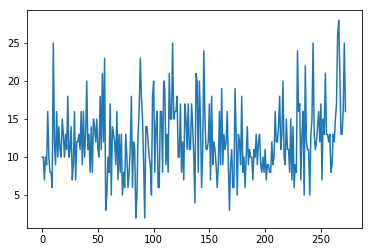

Observations: 275
Training Observations: 274
Testing Observations: 1


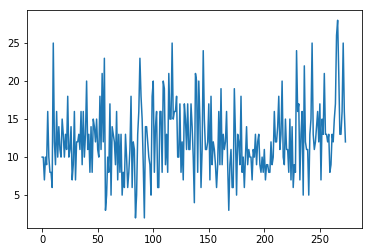

Observations: 276
Training Observations: 275
Testing Observations: 1


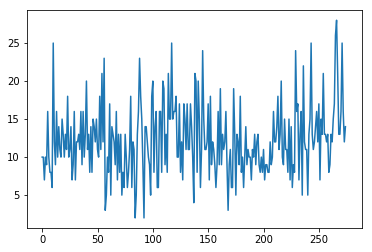

Observations: 277
Training Observations: 276
Testing Observations: 1


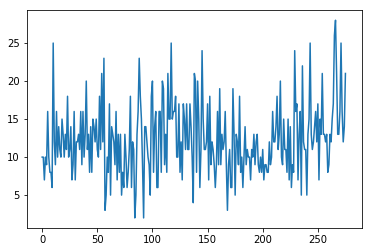

Observations: 278
Training Observations: 277
Testing Observations: 1


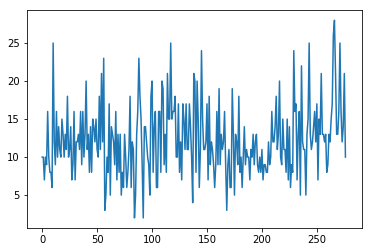

Observations: 279
Training Observations: 278
Testing Observations: 1


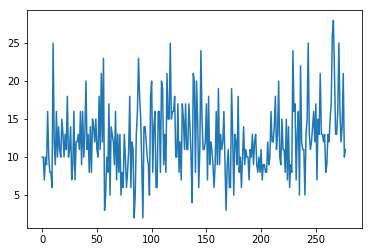

Observations: 280
Training Observations: 279
Testing Observations: 1


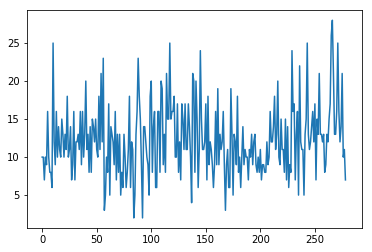

Observations: 281
Training Observations: 280
Testing Observations: 1


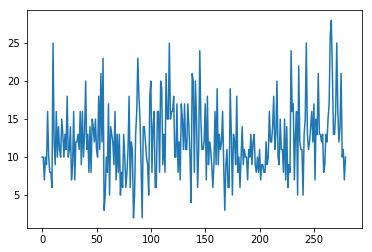

Observations: 282
Training Observations: 281
Testing Observations: 1


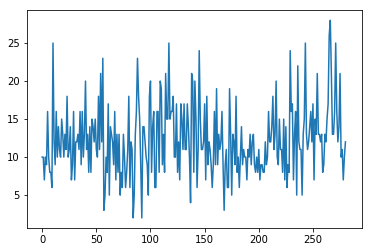

Observations: 283
Training Observations: 282
Testing Observations: 1


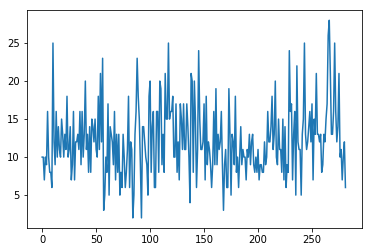

Observations: 284
Training Observations: 283
Testing Observations: 1


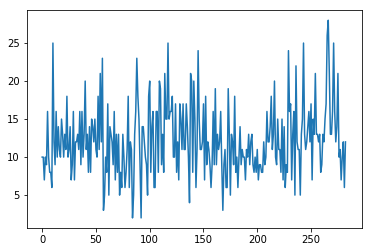

Observations: 285
Training Observations: 284
Testing Observations: 1


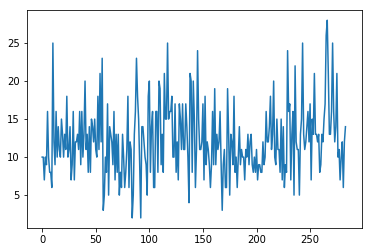

Observations: 286
Training Observations: 285
Testing Observations: 1


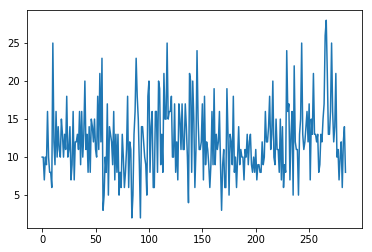

Observations: 287
Training Observations: 286
Testing Observations: 1


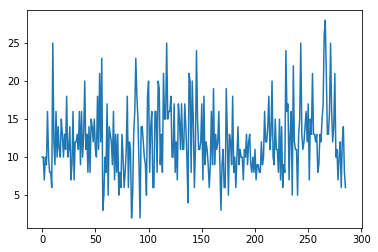

Observations: 288
Training Observations: 287
Testing Observations: 1


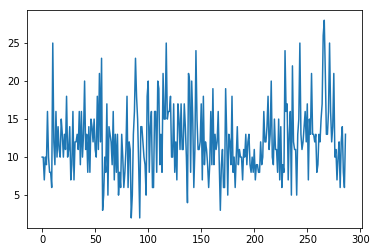

Observations: 289
Training Observations: 288
Testing Observations: 1


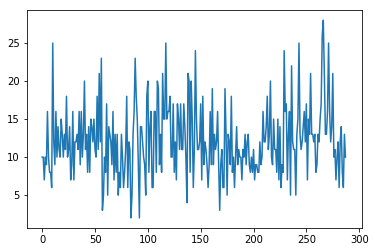

Observations: 290
Training Observations: 289
Testing Observations: 1


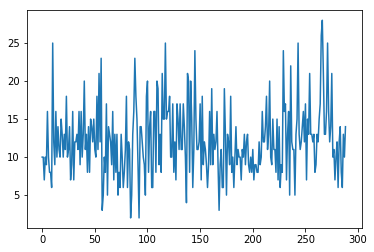

Observations: 291
Training Observations: 290
Testing Observations: 1


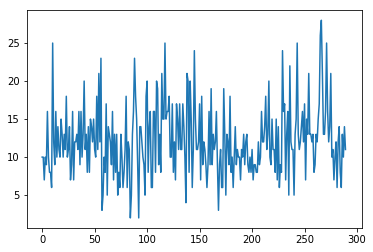

Observations: 292
Training Observations: 291
Testing Observations: 1


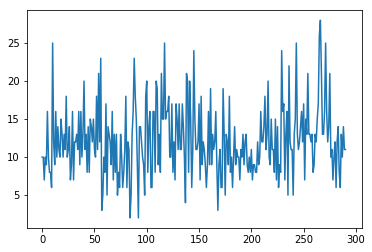

Observations: 293
Training Observations: 292
Testing Observations: 1


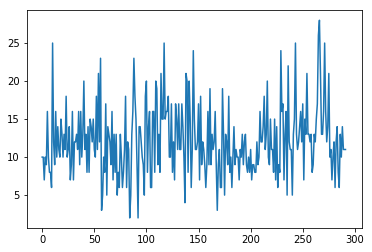

Observations: 294
Training Observations: 293
Testing Observations: 1


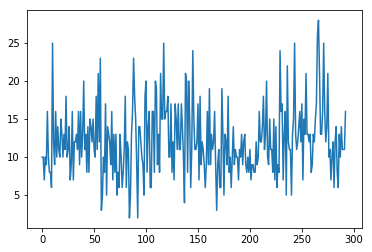

Observations: 295
Training Observations: 294
Testing Observations: 1


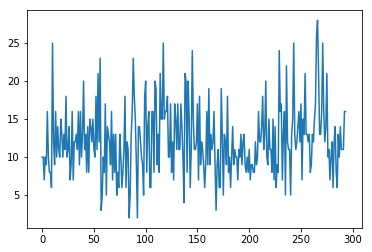

Observations: 296
Training Observations: 295
Testing Observations: 1


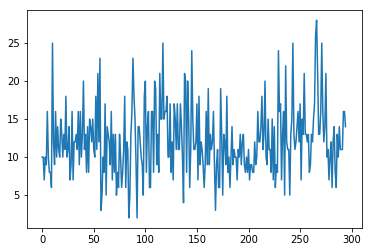

Observations: 297
Training Observations: 296
Testing Observations: 1


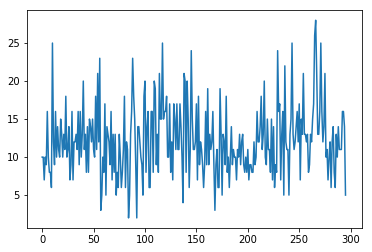

Observations: 298
Training Observations: 297
Testing Observations: 1


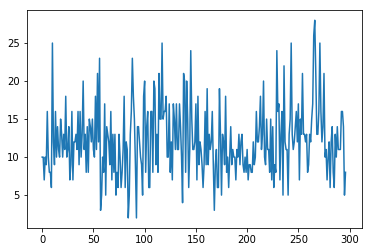

Observations: 299
Training Observations: 298
Testing Observations: 1


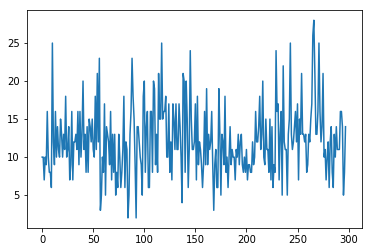

Observations: 300
Training Observations: 299
Testing Observations: 1


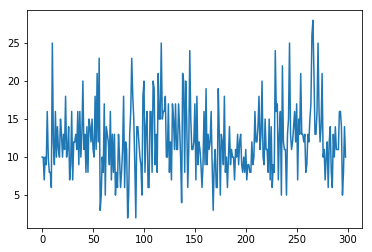

Observations: 301
Training Observations: 300
Testing Observations: 1


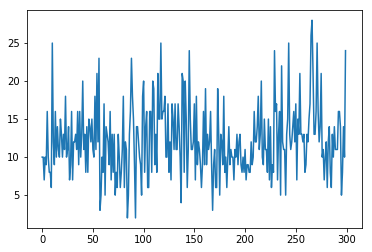

Observations: 302
Training Observations: 301
Testing Observations: 1


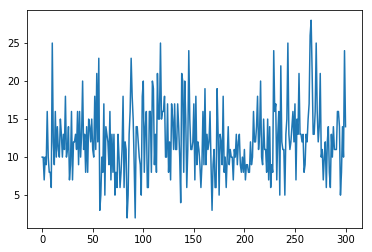

Observations: 303
Training Observations: 302
Testing Observations: 1


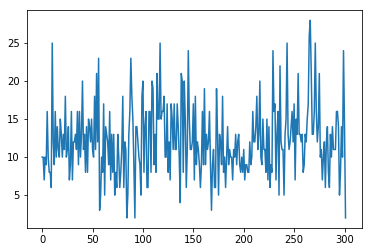

Observations: 304
Training Observations: 303
Testing Observations: 1


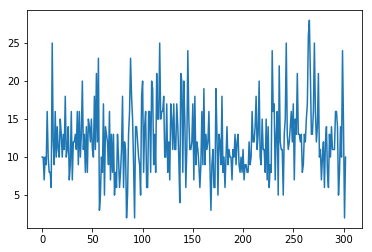

Observations: 305
Training Observations: 304
Testing Observations: 1


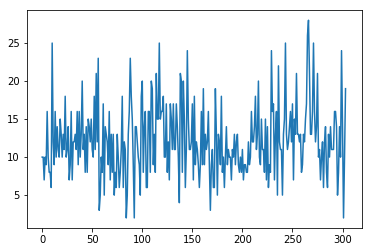

Observations: 306
Training Observations: 305
Testing Observations: 1


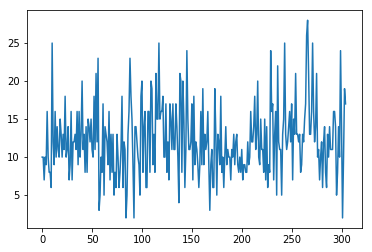

Observations: 307
Training Observations: 306
Testing Observations: 1


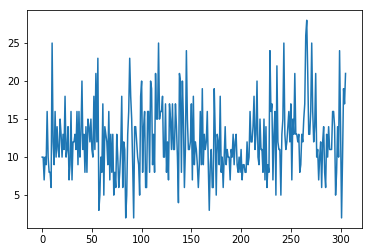

Observations: 308
Training Observations: 307
Testing Observations: 1


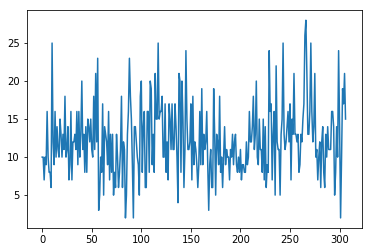

Observations: 309
Training Observations: 308
Testing Observations: 1


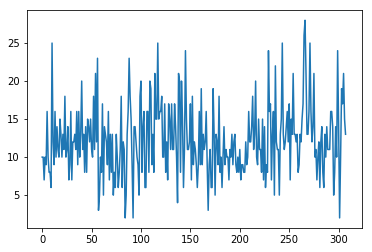

Observations: 310
Training Observations: 309
Testing Observations: 1


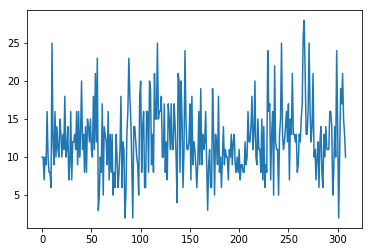

Observations: 311
Training Observations: 310
Testing Observations: 1


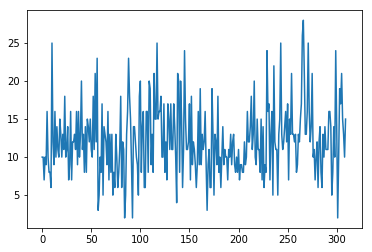

Observations: 312
Training Observations: 311
Testing Observations: 1


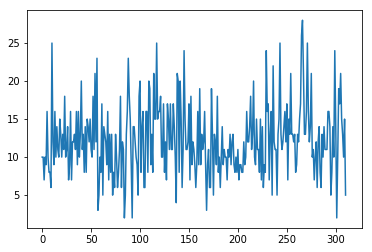

Observations: 313
Training Observations: 312
Testing Observations: 1


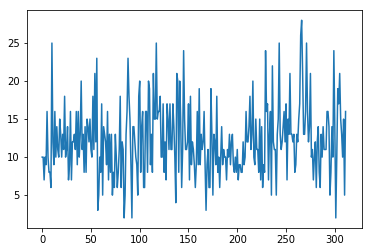

Observations: 314
Training Observations: 313
Testing Observations: 1


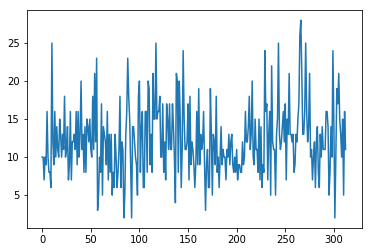

Observations: 315
Training Observations: 314
Testing Observations: 1


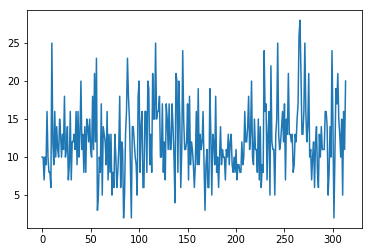

Observations: 316
Training Observations: 315
Testing Observations: 1


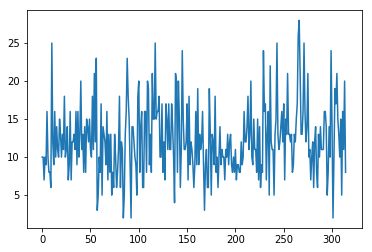

Observations: 317
Training Observations: 316
Testing Observations: 1


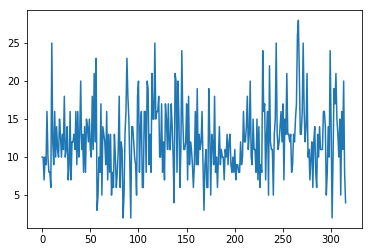

Observations: 318
Training Observations: 317
Testing Observations: 1


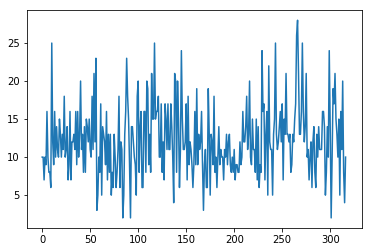

Observations: 319
Training Observations: 318
Testing Observations: 1


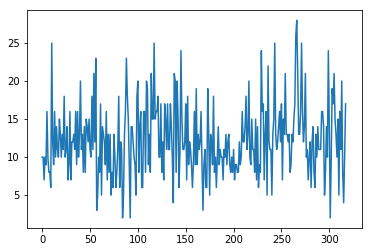

Observations: 320
Training Observations: 319
Testing Observations: 1


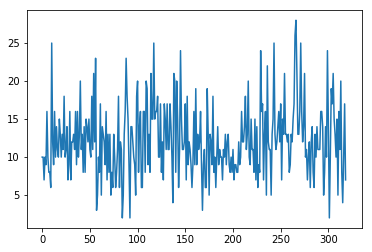

Observations: 321
Training Observations: 320
Testing Observations: 1


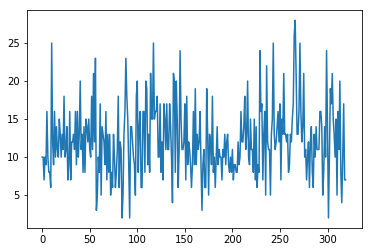

Observations: 322
Training Observations: 321
Testing Observations: 1


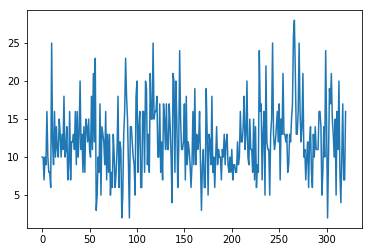

Observations: 323
Training Observations: 322
Testing Observations: 1


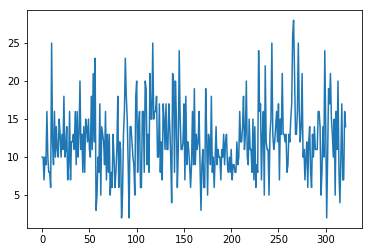

Observations: 324
Training Observations: 323
Testing Observations: 1


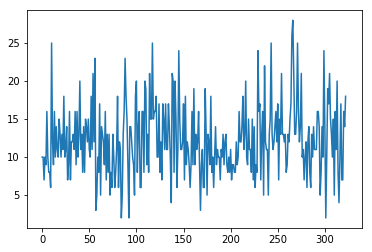

Observations: 325
Training Observations: 324
Testing Observations: 1


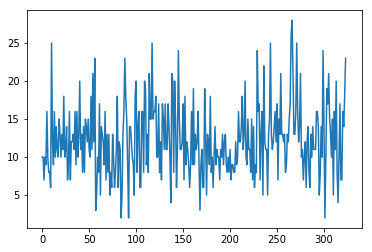

Observations: 326
Training Observations: 325
Testing Observations: 1


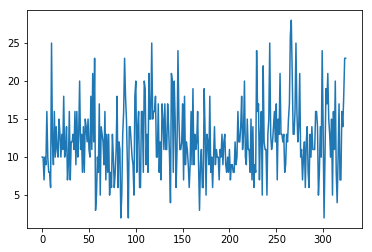

Observations: 327
Training Observations: 326
Testing Observations: 1


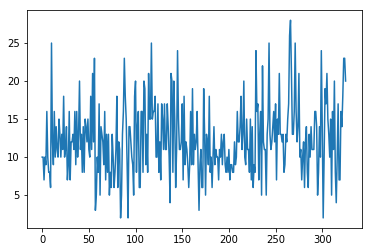

Observations: 328
Training Observations: 327
Testing Observations: 1


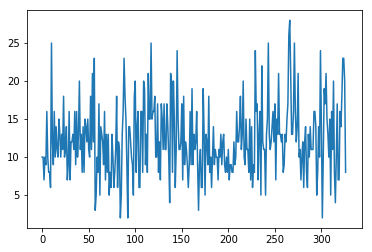

Observations: 329
Training Observations: 328
Testing Observations: 1


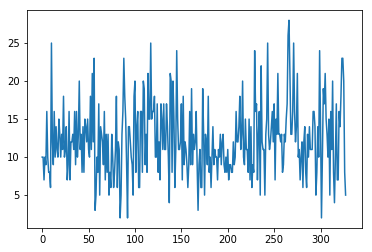

Observations: 330
Training Observations: 329
Testing Observations: 1


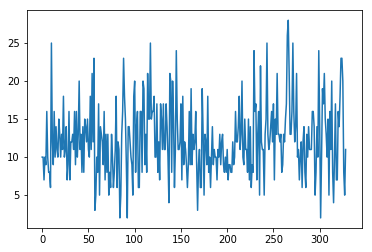

Observations: 331
Training Observations: 330
Testing Observations: 1


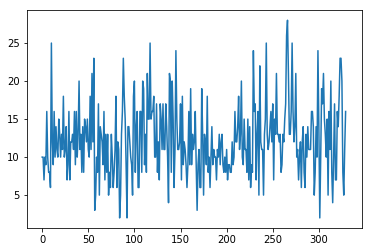

Observations: 332
Training Observations: 331
Testing Observations: 1


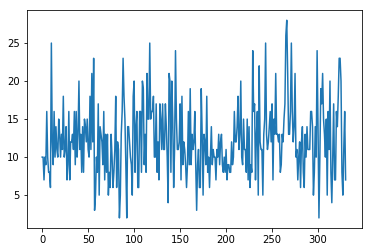

Observations: 333
Training Observations: 332
Testing Observations: 1


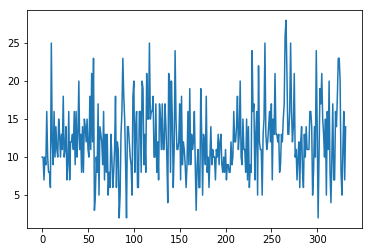

Observations: 334
Training Observations: 333
Testing Observations: 1


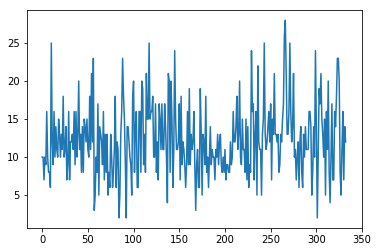

Observations: 335
Training Observations: 334
Testing Observations: 1


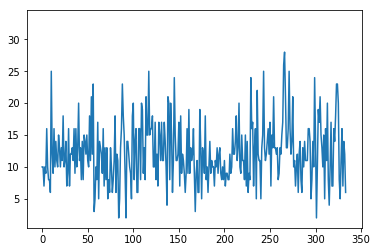

Observations: 336
Training Observations: 335
Testing Observations: 1


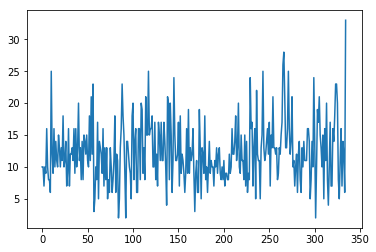

Observations: 337
Training Observations: 336
Testing Observations: 1


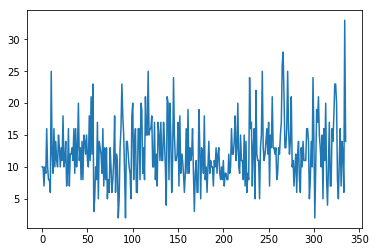

Observations: 338
Training Observations: 337
Testing Observations: 1


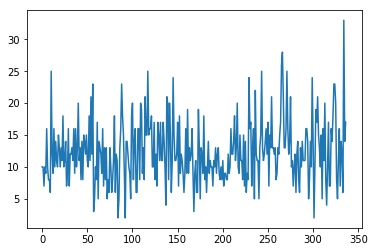

Observations: 339
Training Observations: 338
Testing Observations: 1


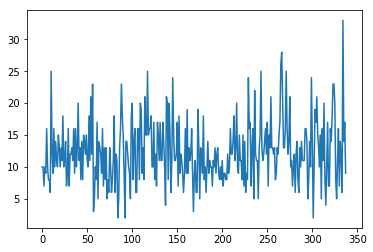

Observations: 340
Training Observations: 339
Testing Observations: 1


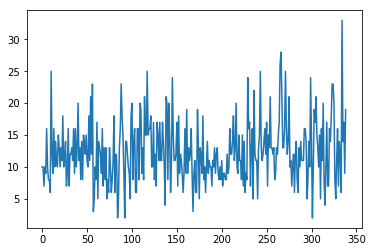

Observations: 341
Training Observations: 340
Testing Observations: 1


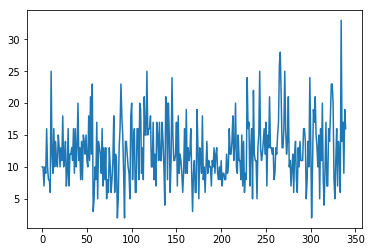

Observations: 342
Training Observations: 341
Testing Observations: 1


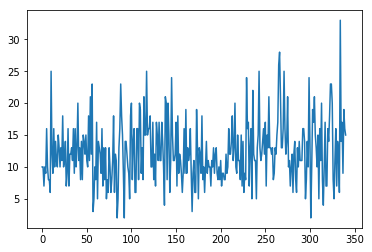

Observations: 343
Training Observations: 342
Testing Observations: 1


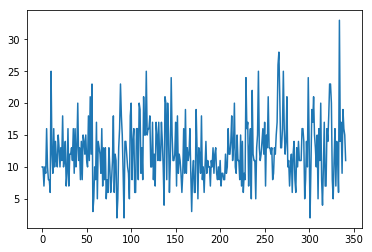

Observations: 344
Training Observations: 343
Testing Observations: 1


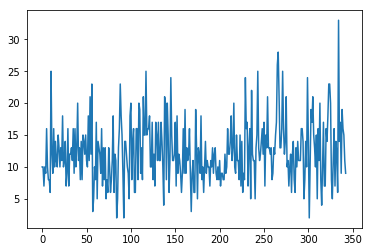

Observations: 345
Training Observations: 344
Testing Observations: 1


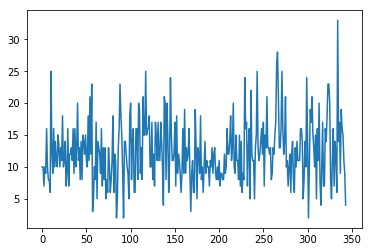

Observations: 346
Training Observations: 345
Testing Observations: 1


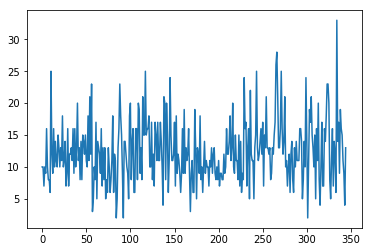

Observations: 347
Training Observations: 346
Testing Observations: 1


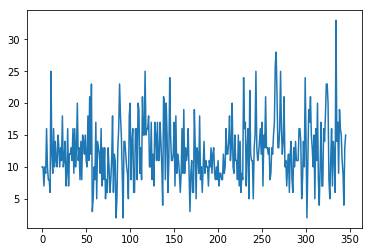

Observations: 348
Training Observations: 347
Testing Observations: 1


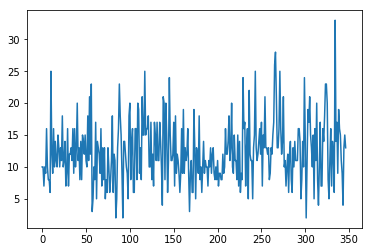

Observations: 349
Training Observations: 348
Testing Observations: 1


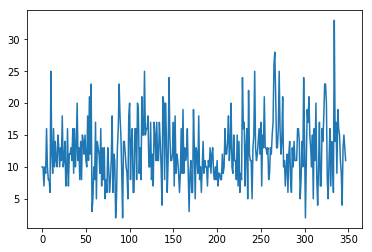

Observations: 350
Training Observations: 349
Testing Observations: 1


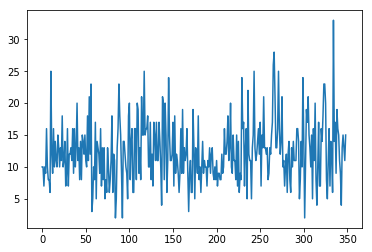

Observations: 351
Training Observations: 350
Testing Observations: 1


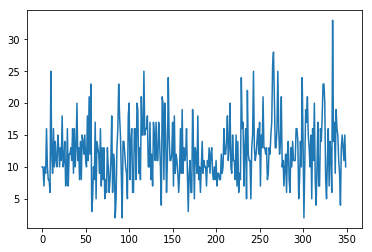

Observations: 352
Training Observations: 351
Testing Observations: 1


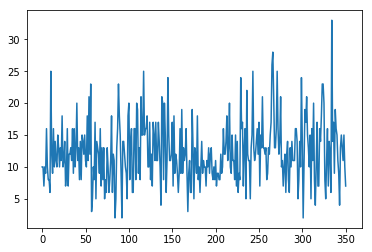

Observations: 353
Training Observations: 352
Testing Observations: 1


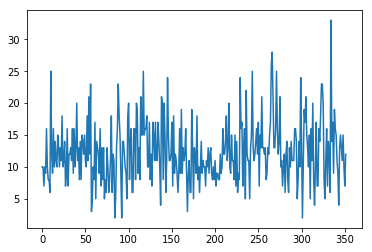

Observations: 354
Training Observations: 353
Testing Observations: 1


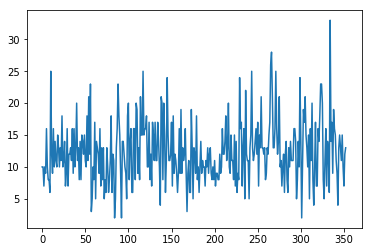

Observations: 355
Training Observations: 354
Testing Observations: 1


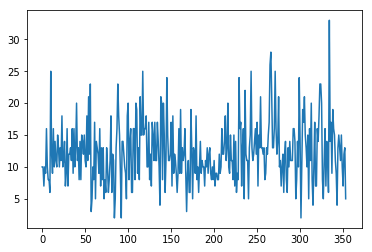

Observations: 356
Training Observations: 355
Testing Observations: 1


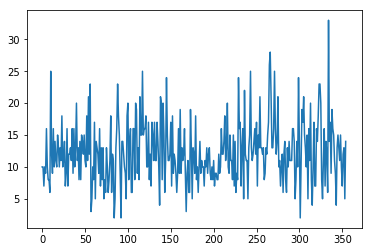

Observations: 357
Training Observations: 356
Testing Observations: 1


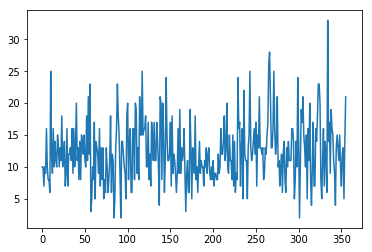

Observations: 358
Training Observations: 357
Testing Observations: 1


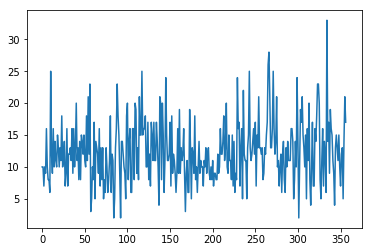

Observations: 359
Training Observations: 358
Testing Observations: 1


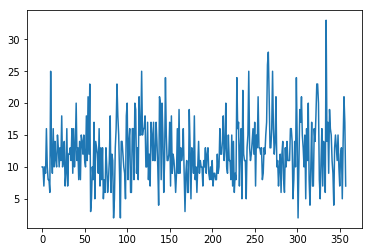

Observations: 360
Training Observations: 359
Testing Observations: 1


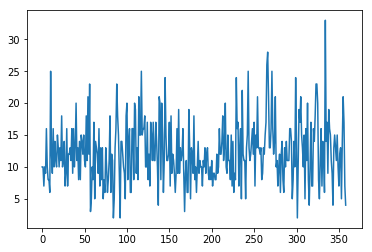

Observations: 361
Training Observations: 360
Testing Observations: 1


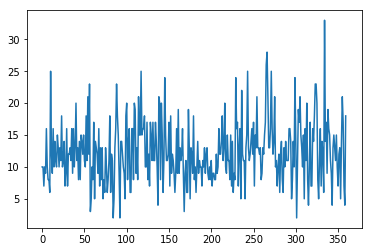

Observations: 362
Training Observations: 361
Testing Observations: 1


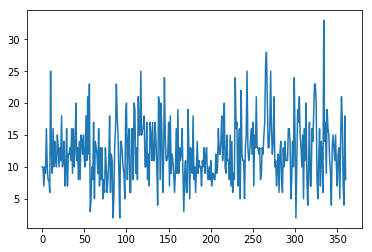

Observations: 363
Training Observations: 362
Testing Observations: 1


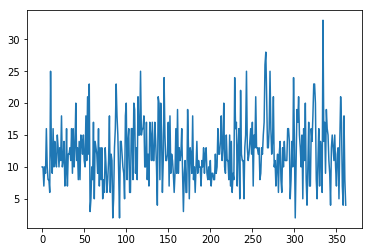

Observations: 364
Training Observations: 363
Testing Observations: 1


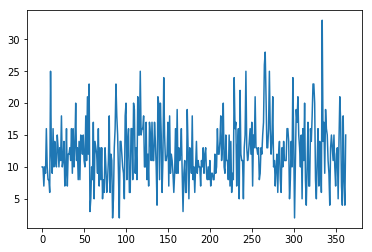

Observations: 365
Training Observations: 364
Testing Observations: 1


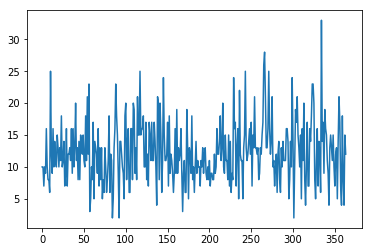

In [29]:
['20910', 'VAR - 20854', 5.1234]
['20902', 'VAR - 20877', 11.9794]
['20906', 'VAR - 20912', 7.9464]
['20874', 'VAR - 20814', 7.0392]
['20904', 'VAR - 20902', 6.2673]
['20850', 'VAR - 20874 20814 20895', 0.0]
['20877', 'AR', 24.0161]
['20878', 'AR', 6.0679]
['20852', 'VAR - 20902 20832 20837', 0.0002]
['20901', 'AR', 0.3077]
['20814', 'AR', 26.2761]
['20886', 'VAR - 20872', 6.2503]
['20876', 'VAR - 20814 20816', 6.5142]
['20912', 'VAR - 20902', 0.1062]
['20817', 'AR', 0.0053]
['20879', 'VAR - 20910', 0.9551]
['20903', 'AR', 7.6537]
['20853', 'VAR - 20906', 0.3523]
['20854', 'AR', 4.5023]
['20815', 'AR', 2.7842]
['20832', 'VAR - 20910 20906', 7.2306]
['20895', 'AR', 5.6959]
['20851', 'VAR - 20871', 34.9126]
['20866', 'VAR - 20874', 6.1919]
['20855', 'AR', 0.0258]
['20905', 'AR', 0.3825]
['20871', 'VAR - 20876', 0.1603]
['20872', 'AR', 3.7553]
['20816', 'VAR - 20876', 0.2545]
['20841', 'VAR - 20895', 0.0067]
['20882', 'AR', 0.033]
['20833', 'AR', 43.1235]
['20837', 'AR', 0.1146]

In [72]:
x = [None, None, None]
x.remove(None)
print(x)

[None, None]


In [87]:
print(len(mse))
print(len(mod))
print(len(zipcodes))

2
2
33


In [11]:
print(ughhh[])

['20910', '20902', '20906', '20874', '20904', '20850', '20877', '20878', '20852', '20901', '20814', '20886', '20876', '20912', '20817', '20879', '20903', '20853', '20854', '20815', '20832', '20895', '20851', '20866', '20855', '20905', '20871', '20872', '20816', '20841', '20882', '20833', '20837']


In [31]:
d = ughhh[40]
d["Crime Count"] = d["Crime Count"].astype(int)

IndexError: list index out of range

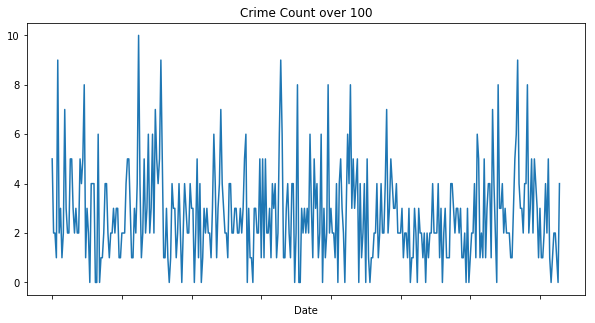

In [30]:
d = ughhh[40]
d["Crime Count"] = d["Crime Count"].astype(int)
ax = d.plot(x ="Date", y = "Crime Count", title = "Crime Count below 100", figsize = (10,5),legend = False)
fig = ax.get_figure()
fig.savefig("!!!!!!below 1000")